# Analyses for Value vs. Perceptual decision making in patients with Amnesia vs. Healthy Controls
## Load packages and define functions

In [1]:
# load all necessary packages
%load_ext rpy2.ipython
%R library(lme4)
%R library(sjPlot)
%R library(ggplot2)

#%load_ext pymatbridge
from __future__ import division
from __future__ import print_function
from scipy.stats import norm
from scipy.signal import fftconvolve
import matplotlib.gridspec as gridspec
import brewer2mpl as b2mpl
import fminbnd
import os, glob, scipy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import nilearn
from nilearn import image
from nilearn import plotting
import multiprocessing  
from joblib import Parallel, delayed
import pickle
import statsmodels

subjidMA=[35,46,51,58,62,63]
#50 excluded b/c they didn't complete DOTS task
#61 excluded due to flat logistic on dots

subjidHC=[220,258,282,290,322,377,409,444,455,475,489,506,507,509]
#104 and 508 exclude due to flat logistic on food task
#503 excluded due to flat logistic on dots task

datapath='../Output/'
eps = 2 ** -52

# a few global variables that speed up optimization
T = None
It = None
STIM_STRENGTH = None
Ic = None

%config InlineBackend.figure_format = 'retina'
sns.set_style('ticks')
sns.set_context('talk')


/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:145: RRuntimeWarning: Loading required package: Matrix

  warnings.warn(x, RRuntimeWarning)


In [2]:
def fitData(
        data, dt=.0005, k=5, B0=1.5, Bdel=1, B2=1,
        tnd=0.5, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1):

    """
    Fit choices and reaction times to a diffusion to bound model
    with exponentially and symmetrically decreasing bounds

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice

    dt : temporal resolution of the simulated diffusion process

    ########## The following are initial values of parameters ##############

    k : float, proportionality constant between stim_strength and drift rate

    B0 : float, initial bound height

    Bdelay : float, delay in seconds before bound starts decreasing

    B2 : float, coefficient of exponential term that governs bound decrease

    tnd: float, non decision time

    tnd_sd: float, standard deviation of non-decision time

    stim_strength_bias : bias in drift rate (added to stim_strength before k mult)

    y0 : initial offset of decision variable (relative to 0)
    
    plaw : power law coefficient for stim_strengths


    Returns
    -------
    theta : 1D array of 9 params -
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    """

    global T, It, STIM_STRENGTH, Ic
    T, It, STIM_STRENGTH, Ic = None, None, None, None

    stim_strengths = data[:, 0]
    rt = data[:, 1]
    ci = data[:, 2]

    # plausible bounds for the parameters
    theta_lo = [ 0,  0, 0,   0, 0.3, 0.001, -1, 0,  1]
    theta_hi = [35, 50, 3.5, 3,   2,   0.2,  1, 0, 1]
    
    theta_init = [k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw]

    theta, fopt = fminbnd.fminbnd(
        calculateNegLL, theta_init, args=(stim_strengths, rt, ci, dt),
        LB=theta_lo, UB=theta_hi)

    # clear the globals
    T, It, STIM_STRENGTH, Ic = None, None, None, None

    #return theta
    return theta, fopt

In [3]:
def calculateNegLL(theta, stim_strengths, rt, ci, dt=0.0005):
    """
    Given a  diffusion to bound model with quadratically collapsing bounds
    parametrized by theta, compute the negative log likelihood of the data

    Parameters
    ----------
    theta : 8 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0

    stim_strengths : array of stimulus strengths, length equal to # trials

    rt : array of reaction times, length equal to # trials

    ci : array of choices (0, 1: 1 is correct choice for positive
         stim_strengths), length equal to # trials

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    neglogll : float, negative log likelihood of the data

    """

    global T, It, STIM_STRENGTH, Ic

    # unpack parameters
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    u_stim_strengths = np.unique(stim_strengths)

    # propagate expects drift to be 2d so that it can tile properly
    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, u_stim_strengths, np.max(rt), dt)

    # propagate density
    D = propagate(drifts, t, Bup, Blo, y, yinit)

    # convolve distribution of exit times with Gaussian distribution of tnd
    r = norm.pdf(t, tnd, tnd_sd) * dt
    P_UP = np.zeros([D['up']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['up']['pdf_t'].shape[1]])
    P_LO = np.zeros([D['lo']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['up']['pdf_t'].shape[1]])
    P_BOTH = np.zeros([D['both']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['both']['pdf_t'].shape[1]])
    for i in range(len(u_stim_strengths)):
        P_UP[:, i] = fftconvolve(D['up']['pdf_t'][:, i], r.flatten())
        P_LO[:, i] = fftconvolve(D['lo']['pdf_t'][:, i], r.flatten())
        P_BOTH[:, i] = fftconvolve(D['both']['pdf_t'][:, i], r.flatten())

    if T is None:
        # find time index of each trial
        T = np.tile(t, [1, len(rt)])
        It = np.sum(~(T >= rt), axis=0) - 1

        # find stim_strength index of each trial
        C = np.tile(np.atleast_2d(u_stim_strengths), [len(stim_strengths), 1])
        Ic = np.sum(C <= np.atleast_2d(stim_strengths).T, axis=1) - 1

    p_up = P_UP[It, Ic]
    p_lo = P_LO[It, Ic]
    p_both = P_BOTH[It, Ic]
    p_up = np.clip(p_up, eps, 1 - eps)
    p_lo = np.clip(p_lo, eps, 1 - eps)
    p_both = np.clip(p_both, eps, 1 - eps)

    ppred = p_up * ci + p_lo * np.logical_not(ci)
    #ppred = p_both
    neglogl = -np.sum(np.log(ppred.astype('float')))

    return neglogl

In [4]:
def propagate(drifts, t, Bup, Blo, y, y0, notabs_flag=False):
    """
    Given a set of drift rates and bounds, compute various quantities
    that characterize the behavior of the drift-diffusion process

    Parameters
    ----------
    drifts : 2D array of shape (1, nd) where nd is the number of drift rates;
             this is a row vector of drifts

    t : 2D array of shape (nt, 1) where nt is the number of time points;
        this is a column vector of time points

    Bup : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of upper bounds, one value per each time bin

    Blo : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of lower bounds, one value per each time bin

    y : 2D array of shape (ng, 1) where ng is the number of grid points
        over which to compute Gaussian density; this is a column vector
        of grid points to which y0 corresponds

    y0 : 2D array of shape (ng, 1) where ng is the number of grid points
         over which to compute Gaussian density; this is a column vector
         of actual initial density values

    notabs_flag : boolean, whether to store the not absorbed portion of density

    Returns
    -------
    D : dictionary, contains for each unique stimulus strengh the probability
        of hitting the upper or lower bound, the mean reaction times for the
        two bounds, and the cumulative distribution of reaction times for the
        two bounds (and the not absored densities if requested)

    """
    
    nd = drifts.shape[1]
    nt = t.shape[0]
    dt = t[1, 0] - t[0, 0]
    ny = y.shape[0]

    D = {}
    D['bounds'] = np.column_stack([Bup, Blo])
    D['drifts'] = drifts

    # create fft of zero mean, unit variance gaussian
    kk = np.tile(np.atleast_2d(np.concatenate(
        [np.arange(0, ny / 2 + 1), np.arange(-ny / 2 + 1, 0)])).T, [1, nd])
    omega = 2 * np.pi * kk / (np.max(y) - np.min(y))
    E1 = np.exp(-0.5 * dt * np.power(omega, 2))
    D['up'] = {}
    D['lo'] = {}
    D['both'] = {}
    if notabs_flag:
        D['notabs'] = {}

    D['up']['pdf_t'] = np.zeros([nt, nd])
    D['lo']['pdf_t'] = np.zeros([nt, nd])
    D['both']['pdf_t'] = np.zeros([nt, nd])
    if notabs_flag:
        D['notabs']['pdf'] = np.zeros([nd, ny, nt])

    # U is initial state, one column for each drift rate
    U = np.tile(y0, [1, nd])

    # shift mean of zero mean, unit variance gaussian by drift
    E2 = E1 * np.exp(-1j * omega * np.tile(drifts, [ny, 1]) * dt)

    # prepare the values to propagate for vectorization
    y = np.tile(y, [1, nd])
    p_threshold = .00001
    for i in range(nt):
        # fft current pdf
        Ufft = np.fft.fft(U, axis=0)

        # convolve with gaussian with drift in the frequency domain
        Ufft = E2 * Ufft

        # turn back into time domain
        U = np.real(np.fft.ifft(Ufft, axis=0))
        U = np.clip(U, 0, np.inf)

        D['up']['pdf_t'][i, :] = np.sum(U * (y >= Bup[i]), axis=0)
        D['lo']['pdf_t'][i, :] = np.sum(U * (y <= Blo[i]), axis=0)
        D['both']['pdf_t'][i, :] = np.sum(U * ((y <= Blo[i]) | (y >= Bup[i])), axis=0)

        # keep only density within bounds
        U *= np.logical_and(y > Blo[i], y < Bup[i])

        # store not absorbed density if requested
        if notabs_flag:
            D['notabs']['pdf'][:, :, i] = U.T

        if np.sum(np.sum(U, axis=0) < p_threshold) == nd:
            break

    D['t'] = t

    D['up']['p'] = np.sum(D['up']['pdf_t'], axis=0)
    D['lo']['p'] = np.sum(D['lo']['pdf_t'], axis=0)
    D['both']['p'] = np.sum(D['both']['pdf_t'], axis=0)

    D['up']['mean_t'] = np.dot(t.T, D['up']['pdf_t']) / D['up']['p']
    D['lo']['mean_t'] = np.dot(t.T, D['lo']['pdf_t']) / D['lo']['p']
    D['both']['mean_t'] = np.dot(t.T, D['both']['pdf_t']) / D['both']['p']

    D['up']['cdf_t'] = np.cumsum(D['up']['pdf_t'], axis=0)
    D['lo']['cdf_t'] = np.cumsum(D['lo']['pdf_t'], axis=0)
    D['both']['cdf_t'] = np.cumsum(D['both']['pdf_t'], axis=0)

    return D

In [5]:
def discretize(theta, stim_strengths, tmax, dt):
    """
    Utility function that sets up the grid on which to do density propagation
    and also computes some additional required quantities

    Parameters
    ----------
    theta : 9 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    stim_strengths : array of unique stimulus strength for which to do
                     propagation

    tmax : float, maximum time for which to propagate

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    drifts : array of shape (nd,) when nd is the number of drifts

    t : array of shape (nt,) where nt is the number of time points;
        vector of time points

    Bup : array of shape (nt,) where nt is the number of time points;
          vector of upper bounds, one value per each time bin

    Blo : array of shape (nt,) where nt is the number of time points;
          vector of lower bounds, one value per each time bin

    y : array of shape (ng,) where ng is the number of grid points
        over which to compute Gaussian density;
        these are the grid points to which y0 corresponds

    yinit : array of shape (ng,) where ng is the number of grid points
            over which to compute Gaussian density;
            these are the  actual initial density values

    """

    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta

    # time
    tmax = tmax + .3
    t = np.arange(0, tmax, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel

    #exponential
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup

    # drift rate
    drifts = k * (stim_strengths + stim_strength_bias)
    
    # max unsigned drift
    md = np.max(np.abs(drifts))
    sm = md * dt + np.sqrt(dt) * 4
    y = np.linspace(np.min(Blo) - sm, np.max(Bup) + sm, 512)
    yinit = 0 * y

    i1 = np.where(y >= y0)[0][0]
    i2 = np.where(y <= y0)[0][-1]

    if i1 == i2:
        yinit[i1] = 1
    else:
        w2 = np.abs(y[i1] - y0)
        w1 = np.abs(y[i2] - y0)

        w1 = w1 / (w1 + w2)
        w2 = (1 - w1)
        yinit[i1] = w1
        yinit[i2] = w2

    drifts = drifts[np.newaxis, :]
    t = t.reshape(-1, 1)
    Bup = Bup.reshape(-1, 1)
    Blo = Blo.reshape(-1, 1)
    y = y.reshape(-1, 1)
    yinit = yinit.reshape(-1, 1)

    return drifts, t, Bup, Blo, y, yinit

In [6]:
def sortedFunc(x, y, func):
    unique_y = np.sort(np.unique(y))
    ny = len(unique_y)

    out_x = np.empty(ny)
    counts_y = np.empty(ny)
    for i, j in zip(range(ny), unique_y):
        out_x[i] = getattr(np, func)(np.array(x)[np.array(y) == j])
        counts_y[i] = np.sum(np.array(y) == j)

    return(np.column_stack([unique_y, out_x, counts_y]))

In [7]:
def plotDotsDataWithFitTwoGroup(data1, theta1,data2,theta2, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    k2, B02, Bdel2, B22, tnd2, tnd_sd2, stim_strength_bias2, y02, plaw2 = theta2
    stim_strengths2, rt2, ci2, subj2 = data2[:, 0], data2[:, 1], data2[:, 2], data2[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    stim_strengths2 = stim_strengths2.astype("complex") ** plaw2
    ustim_strengths1 = np.unique(stim_strengths1) 
    ustim_strengths2 = np.unique(stim_strengths2) 
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    stim_strengths_to_propagate2 = np.linspace(
        np.min(ustim_strengths2), np.max(ustim_strengths2), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    drifts2, t2, Bup2, Blo2, y2, yinit2 = discretize(
        theta2, stim_strengths_to_propagate2, np.max(rt2), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)
    D2 = propagate(drifts2, t2, Bup2, Blo2, y2, yinit2)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]
    meanprop2 = sortedFunc(ci2, stim_strengths2, 'mean')[:, 1]
    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df2=pd.DataFrame(data2,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df2['ci']=df2['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df2['rt']=df2['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
    df2['stim_strength']=stim_strengths2
    
    
    # calculate participant means per subject
    smean1 = df1.groupby(['subj','stim_strength'],as_index=False).mean()
    smean2 = df2.groupby(['subj','stim_strength'],as_index=False).mean()
    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']
    semprop2 = smean2.groupby('stim_strength').sem()['ci']
    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']
        semprop2 = df2.groupby('stim_strength').sem()['ci']

    
    # predicted proportions
    predprop1 = D1['up']['p'][:]
    predprop2 = D2['up']['p'][:]

    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    bothmeans2=df2.groupby(['subj','stim_strength'],as_index=False).mean()
    del bothmeans1['ci'] 
    del bothmeans2['ci'] 
    
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    meanrt_both2=df2.groupby(['stim_strength']).mean()['rt']
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    semrt_both2=bothmeans2.groupby('stim_strength').sem()['rt']
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
        semrt_both2=df2.groupby('stim_strength').sem()['rt']
        
    

    predrt_both1 = D1['both']['mean_t'][0] + tnd1
    predrt_both2 = D2['both']['mean_t'][0] + tnd2

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color='b',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color='b'))

    ax_choice.errorbar(ustim_strengths2, meanprop2, yerr=semprop2, color='r',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate2, predprop2, color='r'))

    xdata = [stim_strengths_to_propagate1,stim_strengths_to_propagate2]
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond blue)')
    #ax_choice.set_title('Perceptual decisions')
        
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)
    ustim_strengths2=np.array(meanrt_both2.index)
    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color='b', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color='b', marker='None'))

    ax_rt.errorbar(ustim_strengths2, meanrt_both2, yerr=semrt_both2,
                   color='r', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate2, predrt_both2,
        color='r', marker='None'))
    
    ax_rt.set_xlabel('Color coherence (log(blue/yellow))')
    ax_rt.set_ylabel('Reaction time (s)')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(.8,1.9)

    ax_rt.set_xlabel('Color coherence (log(blue/yellow))')
    ax_rt.set_ylabel('Reaction time (s)')

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/perceptual_group.pdf', dpi=300,format='pdf')
    plt.show()
    

In [8]:
def plotFoodbinDataWithFitTwoGroup(data1, theta1,data2,theta2, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    k2, B02, Bdel2, B22, tnd2, tnd_sd2, stim_strength_bias2, y02, plaw2 = theta2
    stim_strengths2, rt2, ci2, subj2 = data2[:, 0], data2[:, 1], data2[:, 2], data2[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    stim_strengths2 = stim_strengths2.astype("complex") ** plaw2
    ustim_strengths1 = np.unique(stim_strengths1) 
    ustim_strengths2 = np.unique(stim_strengths2) 
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    stim_strengths_to_propagate2 = np.linspace(
        np.min(ustim_strengths2), np.max(ustim_strengths2), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    drifts2, t2, Bup2, Blo2, y2, yinit2 = discretize(
        theta2, stim_strengths_to_propagate2, np.max(rt2), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)
    D2 = propagate(drifts2, t2, Bup2, Blo2, y2, yinit2)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]
    meanprop2 = sortedFunc(ci2, stim_strengths2, 'mean')[:, 1]
    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df2=pd.DataFrame(data2,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df2['ci']=df2['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df2['rt']=df2['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
    df2['stim_strength']=stim_strengths2
    
    
    # calculate participant means per subject
    smean1 = df1.groupby(['subj','stim_strength'],as_index=False).mean()
    smean2 = df2.groupby(['subj','stim_strength'],as_index=False).mean()
    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']
    semprop2 = smean2.groupby('stim_strength').sem()['ci']
    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']
        semprop2 = df2.groupby('stim_strength').sem()['ci']

    
    # predicted proportions
    predprop1 = D1['up']['p'][:]
    predprop2 = D2['up']['p'][:]

    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    bothmeans2=df2.groupby(['subj','stim_strength'],as_index=False).mean()
    del bothmeans1['ci'] 
    del bothmeans2['ci'] 
    
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    meanrt_both2=df2.groupby(['stim_strength']).mean()['rt']
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    semrt_both2=bothmeans2.groupby('stim_strength').sem()['rt']
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
        semrt_both2=df2.groupby('stim_strength').sem()['rt']
        
    

    predrt_both1 = D1['both']['mean_t'][0] + tnd1
    predrt_both2 = D2['both']['mean_t'][0] + tnd2

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color='b',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color='b'))

    ax_choice.errorbar(ustim_strengths2, meanprop2, yerr=semprop2, color='r',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate2, predprop2, color='r'))

    xdata = [stim_strengths_to_propagate1,stim_strengths_to_propagate2]
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond right)')
    #ax_choice.set_title('Perceptual decisions')
        
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)
    ustim_strengths2=np.array(meanrt_both2.index)
    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color='b', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color='b', marker='None'))

    ax_rt.errorbar(ustim_strengths2, meanrt_both2, yerr=semrt_both2,
                   color='r', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate2, predrt_both2,
        color='r', marker='None'))
    
    ax_rt.set_xlabel(r'$\Delta$'+'Value (right - left)')
    ax_rt.set_ylabel('Reaction time (s)')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(.8,1.9)

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/valuebin_group.pdf', dpi=300,format='pdf')
    plt.show()
    

## Load healthy control (HC) participants perceptual decision task data

In [9]:
# make list of files
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_dots_task_??-*m.txt')

filelist.remove(filelist[filelist.index("../Output/NC290_dots_task_10-Jul-2017_14h30m.txt")])


# load data into dataframe
dotsHC=pd.read_table(filelist[0],sep=r"\s+",engine='python')
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep=r"\s+",engine='python')
    
    dotsHC=pd.concat([dotsHC,tmp],ignore_index=True)

# only take valid trials
isvalidtrial=dotsHC['response']!='x'
dotsHC=dotsHC[isvalidtrial]

# code chose choseblue
isorder1=dotsHC['button_order'] == 1
ispressleft=dotsHC['response'] == 'z' 
isorder2=dotsHC['button_order'] == 2
ispressright=dotsHC['response'] == 'm'

choseblue = (isorder1 & ispressleft) | (isorder2 & ispressright)

#make new column in dataframe for choseblue
dotsHC=dotsHC.assign(choseblue=choseblue)

dotsHC.to_csv('dotsHC.csv')

# make aggregated dataframe per color_coh per participant (error bars are for SEM across participants)
dotsHC_bycolorcoh=dotsHC.groupby(['subjid','color_coh']).aggregate('mean')
# make aggregated dataframe per color_coh
meansHC=dotsHC.groupby(['color_coh']).aggregate('mean')
semsHC=dotsHC_bycolorcoh.groupby(['color_coh']).aggregate('sem')

datadotsHC=np.column_stack([dotsHC['color_coh'],dotsHC['RT'],dotsHC['choseblue']])

## Fit DDM to combined HC perceptual task data

In [10]:
[thetadotsHC,dotsfoptHC]=fitData(datadotsHC)
pickle.dump([thetadotsHC,dotsfoptHC],open('thetadotsHCcombined.p','wb'))

## Load Amnesia partients (MA) perceptual decision task data

In [11]:
# make list of files
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_dots_task_??-*m.txt')

# load data into dataframe
dotsMA=pd.read_table(filelist[0],sep=r"\s+",engine='python')
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep=r"\s+",engine='python')
    dotsMA=pd.concat([dotsMA,tmp],ignore_index=True)

# only take valid trials
isvalidtrial=dotsMA['response']!='x'
dotsMA=dotsMA[isvalidtrial]

# coade chose choseblue
isorder1=dotsMA['button_order'] == 1
ispressleft=dotsMA['response'] == 'z' 
isorder2=dotsMA['button_order'] == 2
ispressright=dotsMA['response'] == 'm'

choseblue = (isorder1 & ispressleft) | (isorder2 & ispressright)

#make new column in dataframe for choseblue
dotsMA=dotsMA.assign(choseblue=choseblue)

dotsMA.to_csv('dotsMA.csv')

# make aggregated dataframe per color_coh per participant (error bars are for SEM across participants)
dotsMA_bycolorcoh=dotsMA.groupby(['subjid','color_coh']).aggregate('mean')
# make aggregated dataframe per color_coh
meansMA=dotsMA.groupby(['color_coh']).aggregate('mean')
semsMA=dotsMA_bycolorcoh.groupby(['color_coh']).aggregate('sem')

datadotsMA=np.column_stack([dotsMA['color_coh'],dotsMA['RT'],dotsMA['choseblue']])

## Fit DDM to combined MA perceptual task data

In [12]:
[thetadotsMA,dotsfoptMA]=fitData(datadotsMA)
pickle.dump([thetadotsMA,dotsfoptMA],open('thetadotsMAcombined.p','wb'))

## Plot combined perceptual task data and fits for patients (red) and HCs (blue)
### Figure 5A

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


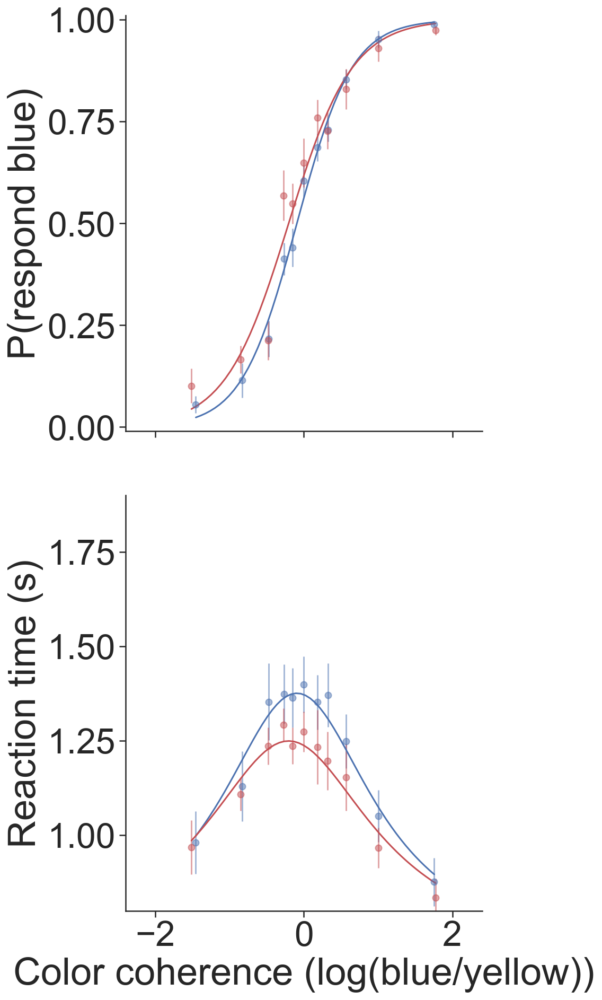

In [14]:
dotsHC=pd.read_csv("dotsHC.csv")
datadotsHC=np.column_stack([dotsHC['color_coh'],dotsHC['RT'],dotsHC['choseblue'],dotsHC['subjid']])
[thetadotsHC,dotsfoptHC]=pickle.load(open('thetadotsHCcombined.p','rb'))

dotsMA=pd.read_csv("dotsMA.csv")
datadotsMA=np.column_stack([dotsMA['color_coh'],dotsMA['RT'],dotsMA['choseblue'],dotsMA['subjid']])
[thetadotsMA,dotsfoptMA]=pickle.load(open('thetadotsMAcombined.p','rb'))

sns.set_context('talk')
sns.set(font_scale=3)
sns.set_style('ticks')
# HC in blue and AN in red
plotDotsDataWithFitTwoGroup(datadotsHC, thetadotsHC, datadotsMA, thetadotsMA, dt=.0005)


## Multilevel logistic regression interaction model on perceptual decision task choice data

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Computing bootstrap confidence intervals ...

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Following variables had many unique values and were prettified: colorcohc. Use `pretty = FALSE` to get smoother plots with all values, however, at the cost of increased memory usage.

  warnings.warn(x, RRuntimeWarning)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseblue ~ colorcohc * gpc + (colorcohc | subjid)
   Data: dots

     AIC      BIC   logLik deviance df.resid 
  3822.3   3866.6  -1904.1   3808.3     4161 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-36.093  -0.565   0.114   0.624  21.906 

Random effects:
 Groups Name        Variance Std.Dev. Corr 
 subjid (Intercept) 0.1385   0.3722        
        colorcohc   1.0218   1.0108   -0.06
Number of obs: 4168, groups:  subjid, 20

Fixed effects:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept)    0.45086    0.09306   4.845 1.27e-06 ***
colorcohc      2.66760    0.25074  10.639  < 2e-16 ***
gpc           -0.20216    0.20239  -0.999    0.318    
colorcohc:gpc  0.57683    0.53377   1.081    0.280    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr) clrchc gpc

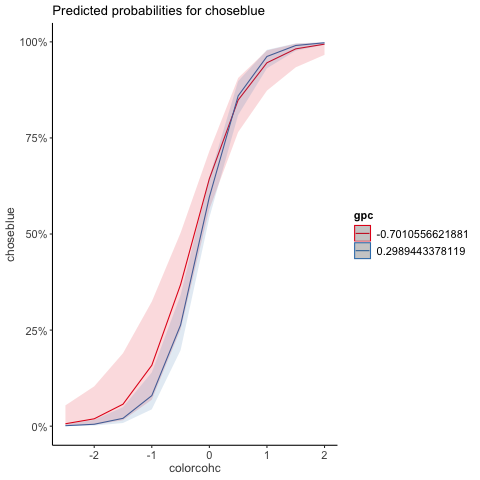

In [14]:
%%R
dotsHC=read.delim('dotsHC.csv',sep=',')
dotsHC$group="Healthy"
dotsMA=read.delim('dotsMA.csv',sep=',')
dotsMA$group="Amnesia"

head(dotsMA)

dots=rbind(dotsHC,dotsMA)
dots$group=as.factor(dots$group)
dots$gp[dots$group=='Healthy']=.5
dots$gp[dots$group=='Amnesia']=-.5

dots$gpc=dots$gp-mean(dots$gp)


for (s in levels(dots$subjid)){
    dots$colorcohc[dots$subjid==s]=dots$color_coh[dots$subjid==s]-mean(dots$color_coh[dots$subjid==s])
    dots$abscolorcohc[dots$subjid==s]=abs(dots$color_coh[dots$subjid==s])-mean(abs(dots$color_coh[dots$subjid==s]))
    dots$trialc[dots$subjid==s]=dots$runtrial[dots$subjid==s]-mean(dots$runtrial[dots$subjid==s])
}

dotschoicemod=glmer(choseblue ~ colorcohc * gpc  + (colorcohc|subjid), family='binomial', data=dots)

nranpars <- length(getME(dotschoicemod,"theta"))
nfixpars <- length(fixef(dotschoicemod))
confintdotschoicemod=confint(dotschoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)

save(dotschoicemod,confintdotschoicemod, file = "dotschoicemod.RData")
load("dotschoicemod.RData")

print(summary(dotschoicemod))

print(confintdotschoicemod)

set_theme(base=theme_classic())
plot_model(dotschoicemod,type='int',show.ci=T)

## Multilevel linear regression interaction model on perceptual decision task RT data

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Loading required package: emmeans

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: NOTE: As of emmeans versions > 1.2.3,
      The 'cld' function will be deprecated in favor of 'CLD'.
      You may use 'cld' only if you have package:multcomp attached.

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: ************
Welcome to afex. For support visit: http://afex.singmann.science/

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: - Functions for ANOVAs: aov_car(), aov_ez(), and aov_4()
- Methods for calculating p-values with mixed(): 'KR', 'S', 'LRT', and 'PB'
- 'afex_aov' and 'mixed' objects can be passed to emmeans() for follow

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: logrt ~ abscolorcohc * gpc + trialc + (abscolorcohc | subjid)
   Data: dots

REML criterion at convergence: 2570.1

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-22.7378  -0.5835  -0.0164   0.5729   3.6135 

Random effects:
 Groups   Name         Variance Std.Dev. Corr
 subjid   (Intercept)  0.032984 0.18161      
          abscolorcohc 0.004309 0.06564  0.28
 Residual              0.104733 0.32362      
Number of obs: 4168, groups:  subjid, 20

Fixed effects:
                   Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)       1.109e-01  4.092e-02  1.800e+01   2.710   0.0143 *  
abscolorcohc     -1.963e-01  1.638e-02  1.810e+01 -11.985 4.82e-10 ***
gpc               7.543e-02  8.929e-02  1.800e+01   0.845   0.4093    
trialc           -1.615e-04  8.328e-05  4.134e+03  -1.939   0.0526 .  
abscolorcohc:gpc -5.011e-02  3.567e-02  1.795e+01  -1.405   0.177

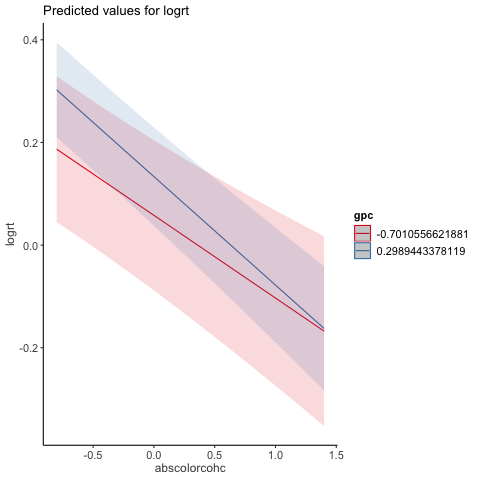

In [15]:
%%R
library(afex)
dots$logrt=log(dots$RT)
dotsrtmod=lmer(logrt ~ abscolorcohc * gpc + trialc + (abscolorcohc|subjid), data=dots)

nranpars <- length(getME(dotsrtmod,"theta"))
nfixpars <- length(fixef(dotsrtmod))
confintdotsrtmod=confint(dotsrtmod,method="boot", nsim=1000, parm=(nranpars+2):(nranpars+nfixpars+1), parallel="multicore", ncpus=8)

save(dotsrtmod,confintdotsrtmod, file = "dotsrtmod.RData")
load("dotschoicemod.RData")

print(summary(dotsrtmod))

print(confintdotsrtmod)

plot_model(dotsrtmod,type='int',show.ci=T)

## Load healthy control (HC) participants value-based decision task data

In [16]:
# make list of files
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_food_choice_run*m.txt')

# load data into dataframe
foodHC=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    foodHC=pd.concat([foodHC,tmp],ignore_index=True)
    
# only take valid trials
isvalidtrial=foodHC['Response']!='x'
foodHC=foodHC[isvalidtrial]

# code chose right
choseright=foodHC['Response'] == 'm' 
foodHC=foodHC.assign(choseright=choseright)

foodHC.to_csv('foodHCallitems.csv')

# Exclude trials that include the following items for participant 444
# because the particiant misnamed or didn't know what the item was during the rating phase:
# apple_slices, avocado, grilled cheese

include=(((foodHC.subjectID=='NC444') & ((foodHC.ImageLeft != "apple_slices.jpg") & (foodHC.ImageLeft != "avocado.jpg") & (foodHC.ImageLeft != "grilled_cheese.jpg") & 
                                       (foodHC.ImageRight != "apple_slices.jpg") & (foodHC.ImageRight != "avocado.jpg") & (foodHC.ImageRight != "grilled_cheese.jpg"))) | 
         (foodHC.subjectID != 'NC444'))
foodHC=foodHC[include]

# make list of rating data files
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_food_rating_run1*m.txt')

# load rating data into dataframe
rating1HC=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    rating1HC=pd.concat([rating1HC,tmp],ignore_index=True)

# make list of rating data files
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_food_rating_run2*m.txt')

# load rating data into dataframe
ratingHC=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    ratingHC=pd.concat([ratingHC,tmp],ignore_index=True)

ratingHCall=pd.merge(rating1HC,ratingHC,on=['subjectID','itemName'],how='outer')

# exclude the same items that participant 444 did not recognize or misnamed
include=(((ratingHC.subjectID=='NC444') & ((ratingHC.itemName != "apple_slices.jpg") & (ratingHC.itemName != "avocado.jpg") & (ratingHC.itemName != "grilled_cheese.jpg"))) | 
         (ratingHC.subjectID != 'NC444'))    
ratingHC = ratingHC[include]    

for s in ratingHC.subjectID.unique():
    # zscore ratings per participant
    ratingHC.loc[ratingHC['subjectID']==s,'ratingz']=scipy.stats.zscore(ratingHC.loc[ratingHC['subjectID']==s,'rating'])
    # assign zscored rating within the food choice dataframe
    for i in ratingHC.loc[ratingHC['subjectID']==s,'itemName'].unique():
        foodHC.loc[(foodHC['subjectID']==s) & (foodHC['ImageLeft']==i),'ratingzLeft']=ratingHC.loc[(ratingHC['subjectID']==s) & (ratingHC['itemName']==i),'ratingz'].values[0]
        foodHC.loc[(foodHC['subjectID']==s) & (foodHC['ImageRight']==i),'ratingzRight']=ratingHC.loc[(ratingHC['subjectID']==s) & (ratingHC['itemName']==i),'ratingz'].values[0]

# calculate deltavalue from z-scored ratings
foodHC=foodHC.assign(deltaval=foodHC['ratingzRight']-foodHC['ratingzLeft'])

foodHC['deltavalrnd']=foodHC['deltaval'].round(1)

# save dataframe to csv
foodHC.to_csv('foodHC.csv')

# format data for fit [stimulus_strength, RT, choice]
datafoodHC=np.column_stack([foodHC['deltavalrnd'],foodHC['RT'],foodHC['choseright']])


## Load MA patient value-based decision task data

In [17]:
# make list of files
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_food_choice_run*m.txt')

# load data into dataframe
foodMA=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    foodMA=pd.concat([foodMA,tmp],ignore_index=True)
    
# only take valid trials
isvalidtrial=foodMA['Response']!='x'
foodMA=foodMA[isvalidtrial]

# code chose right
choseright=foodMA['Response'] == 'm' 
foodMA=foodMA.assign(choseright=choseright)

foodMA.to_csv('foodMAallitems.csv')

# reassign value of 10 for cookies and strawberries for patient 62
# they mistakenly clicked elsewhere along the scale, but reported that their intention was to click at the far right side of the scale
foodMA.loc[((foodMA['subjectID']=='MA062') & ((foodMA['ImageLeft']=="cookies.jpg") | (foodMA['ImageLeft']=="strawberries.jpg"))),'ratingLeft']=10
foodMA.loc[((foodMA['subjectID']=='MA062') & ((foodMA['ImageRight']=="cookies.jpg") | (foodMA['ImageRight']=="strawberries.jpg"))),'ratingLeft']=10

# Exclude trials that include the following items for patient 62
# because the particiant misnamed or didn't know what the item was during the rating phase:
# "cherry_tomato.jpg","avocado.jpg","bagel_plain.jpg","cherries.jpg"

include1=(((foodMA.subjectID=='MA062') & ((foodMA.ImageLeft != "cherry_tomato.jpg") & (foodMA.ImageLeft != "avocado.jpg") & (foodMA.ImageLeft != "bagel_plain.jpg") & (foodMA.ImageLeft != "cherries.jpg") &
                                       (foodMA.ImageRight != "cherry_tomato.jpg") & (foodMA.ImageRight != "avocado.jpg") & (foodMA.ImageRight != "bagel_plain.jpg") & (foodMA.ImageRight != "cherries.jpg"))) | 
         (foodMA.subjectID != 'MA062'))

# Exclude trials that include the following items for patient 46
# because the particiant misnamed or didn't know what the item was during the rating phase:
# "avocado.jpg","cherries.jpg","grilled_cheese.jpg"

include2=(((foodMA.subjectID=='MA046') & ((foodMA.ImageLeft != "avocado.jpg") & (foodMA.ImageLeft != "grilled_cheese.jpg") & (foodMA.ImageLeft != "cherries.jpg") &
                                         (foodMA.ImageRight != "avocado.jpg") & (foodMA.ImageRight != "grilled_cheese.jpg") & (foodMA.ImageRight != "cherries.jpg"))) | 
         (foodMA.subjectID != 'MA046'))

# Exclude trials that include the following items for patient 35
# because the particiant misnamed or didn't know what the item was during the rating phase:
# "burger.jpg","avocado.jpg","baby_carrots.jpg"

include3=(((foodMA.subjectID=='MA035') & ((foodMA.ImageLeft != "avocado.jpg") & (foodMA.ImageLeft != "burger.jpg") & (foodMA.ImageLeft != "baby_carrots.jpg") &
                                         (foodMA.ImageRight != "avocado.jpg") & (foodMA.ImageRight != "burger.jpg") & (foodMA.ImageRight != "burger.jpg"))) | 
         (foodMA.subjectID != 'MA035'))

include=include1 & include2 & include3
foodMA=foodMA.loc[include]

# make list of rating data files
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_food_rating_run1*m.txt')

# load rating data into dataframe
rating1MA=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    rating1MA=pd.concat([rating1MA,tmp],ignore_index=True)

rating1MA.
# make list of rating data files
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_food_rating_run2*m.txt')

# load rating data into dataframe
ratingMA=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    ratingMA=pd.concat([ratingMA,tmp],ignore_index=True)

   
ratingMAall=pd.merge(rating1MA,ratingMA,on=['subjectID','itemName'],how='outer')


# assign rating = 10 for items cookies and strawberries
ratingMA.loc[(ratingMA['subjectID']=='MA062') & ((ratingMA['itemName']=="cookies.jpg")|(ratingMA['itemName']=="strawberries.jpg")),'rating']=10

# exclude the same items that patients 62, 46, and 35 did not recognize or misnamed
include1=(((ratingMA.subjectID=='MA062') & ((ratingMA.itemName != "cherry_tomato.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "bagel_plain.jpg") & (ratingMA.itemName != "cherries.jpg"))) | 
         (ratingMA.subjectID != 'MA062'))
include2=(((ratingMA.subjectID=='MA046') & ((ratingMA.itemName != "cherries.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "grilled_cheee.jpg"))) | 
         (ratingMA.subjectID != 'MA046'))
include3=(((ratingMA.subjectID=='MA035') & ((ratingMA.itemName != "burger.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "burger.jpg"))) | 
         (ratingMA.subjectID != 'MA035'))
include=include1 & include2 & include3
ratingMA = ratingMA.loc[include]    

for s in ratingMA.subjectID.unique():
    # zscore ratings per participant
    ratingMA.loc[ratingMA['subjectID']==s,'ratingz']=scipy.stats.zscore(ratingMA.loc[ratingMA['subjectID']==s,'rating'])
    # assign zscored rating within the food choice dataframe
    for i in ratingMA.loc[ratingMA['subjectID']==s,'itemName'].unique():
        foodMA.loc[(foodMA['subjectID']==s) & (foodMA['ImageLeft']==i),'ratingzLeft']=ratingMA.loc[(ratingMA['subjectID']==s) & (ratingMA['itemName']==i),'ratingz'].values[0]
        foodMA.loc[(foodMA['subjectID']==s) & (foodMA['ImageRight']==i),'ratingzRight']=ratingMA.loc[(ratingMA['subjectID']==s) & (ratingMA['itemName']==i),'ratingz'].values[0]

# calculate deltavalue from z-scored ratings
foodMA=foodMA.assign(deltaval=foodMA['ratingzRight']-foodMA['ratingzLeft'])

foodMA['deltavalrnd']=foodMA['deltaval'].round(1)

# save dataframe to csv
foodMA.to_csv('foodMA.csv')

# format data for fit [stimulus_strength, RT, choice]
datafoodMA=np.column_stack([foodMA['deltavalrnd'],foodMA['RT'],foodMA['choseright']])


## Fit DDM to combined HC and MA patient value-based decision task data

In [18]:
foodHC=pd.read_csv('foodHC.csv')
foodHC['absdeltaval']=np.abs(foodHC.deltaval)
for s in foodHC.subjectID.unique():
    foodHC.loc[foodHC.subjectID==s,'deltavalbin']=pd.qcut(foodHC.loc[foodHC.subjectID==s,'deltaval'],11,labels=range(0,11))
    foodHC.loc[foodHC.subjectID==s,'absdeltavalbin']=pd.qcut(foodHC.loc[foodHC.subjectID==s,'absdeltaval'],6,labels=range(0,6))

for b in foodHC.deltavalbin.unique():
    foodHC.loc[foodHC.deltavalbin==b,'deltavalbinv']=foodHC.loc[foodHC.deltavalbin==b,'deltaval'].mean()
for b in foodHC.absdeltavalbin.unique():
    foodHC.loc[foodHC.absdeltavalbin==b,'absdeltavalbinv']=foodHC.loc[foodHC.absdeltavalbin==b,'absdeltaval'].mean()

    
datafoodHCbin=np.column_stack([foodHC['deltavalbinv'],foodHC['RT'],foodHC['choseright'],foodHC['subjectID']])

[thetafoodHCbin, foodfoptHCbin]fitData(datafoodHCbin)
pickle.dump([thetafoodHCbin, foodfoptHCbin],open('thetafoodHCcombinedbin','wb'))

[thetafoodHCbin, foodfoptHCbin]=pickle.load(open("thetafoodHCcombinedbin.p", "rb"))


foodMA=pd.read_csv('foodMA.csv')
foodMA['absdeltaval']=np.abs(foodMA.deltaval)
for s in foodMA.subjectID.unique():
    foodMA.loc[foodMA.subjectID==s,'deltavalbin']=pd.qcut(foodMA.loc[foodMA.subjectID==s,'deltaval'],11,labels=range(0,11))
    foodMA.loc[foodMA.subjectID==s,'absdeltavalbin']=pd.qcut(foodMA.loc[foodMA.subjectID==s,'absdeltaval'],6,labels=range(0,6))

for b in foodMA.deltavalbin.unique():
    foodMA.loc[foodMA.deltavalbin==b,'deltavalbinv']=foodMA.loc[foodMA.deltavalbin==b,'deltaval'].mean()
for b in foodMA.absdeltavalbin.unique():
    foodMA.loc[foodMA.absdeltavalbin==b,'absdeltavalbinv']=foodMA.loc[foodMA.absdeltavalbin==b,'absdeltaval'].mean()


    
datafoodMAbin=np.column_stack([foodMA['deltavalbinv'],foodMA['RT'],foodMA['choseright'],foodMA['subjectID']])

[thetafoodMAbin, foodfoptMAbin]=fitData(datafoodMAbin)
pickle.dump([thetafoodMAbin, foodfoptMAbin],open('thetafoodMAcombinedbin','wb'))


## Plot combined food data and fits for patients (red) and HCs (blue)
### Figure 5B

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


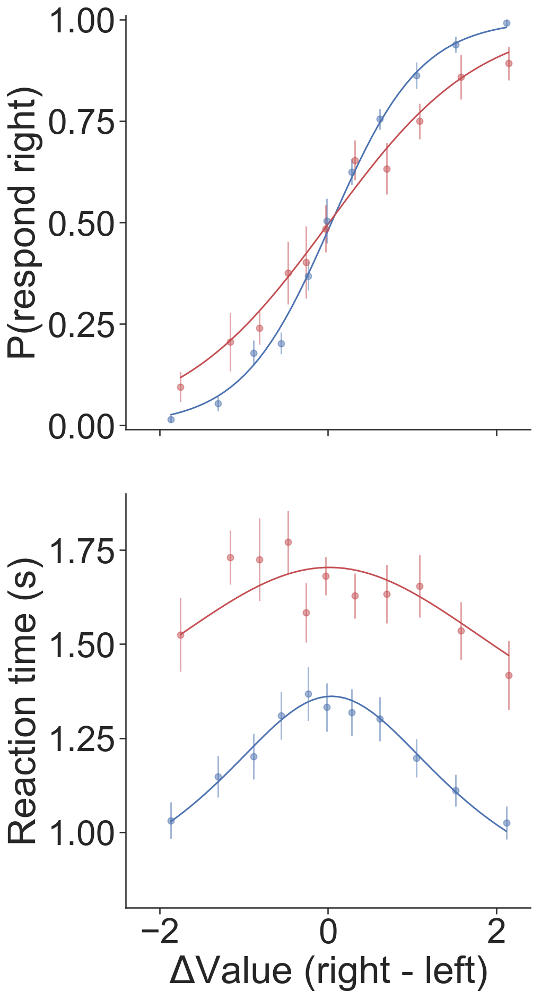

In [19]:
[thetafoodMAbin, foodfoptMAbin]=pickle.load(open('thetafoodMAcombinedbin.p', "rb"))
sns.set_context('talk')
sns.set(font_scale=3)
sns.set_style('ticks')
plotFoodbinDataWithFitTwoGroup(datafoodHCbin, thetafoodHCbin, datafoodMAbin, thetafoodMAbin, dt=.0005)

## Multilevel logistic regression interaction model on value-based decision task choice data

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Following variables had many unique values and were prettified: deltavalc. Use `pretty = FALSE` to get smoother plots with all values, however, at the cost of increased memory usage.

  warnings.warn(x, RRuntimeWarning)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ meanvalc * deltavalc * gpc + (deltavalc * meanvalc |  
    subjectID)
   Data: food

     AIC      BIC   logLik deviance df.resid 
  3511.2   3624.5  -1737.6   3475.2     3993 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-6.4684 -0.5280  0.0164  0.5384  7.8645 

Random effects:
 Groups    Name               Variance Std.Dev. Corr             
 subjectID (Intercept)        0.05264  0.2294                    
           deltavalc          0.20090  0.4482    0.40            
           meanvalc           0.02674  0.1635    0.76 -0.30      
           deltavalc:meanvalc 0.32374  0.5690    0.27  0.77 -0.27
Number of obs: 4011, groups:  subjectID, 20

Fixed effects:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)             0.033460   0.067603   0.495 0.620640    
meanvalc                0.003353   0.06

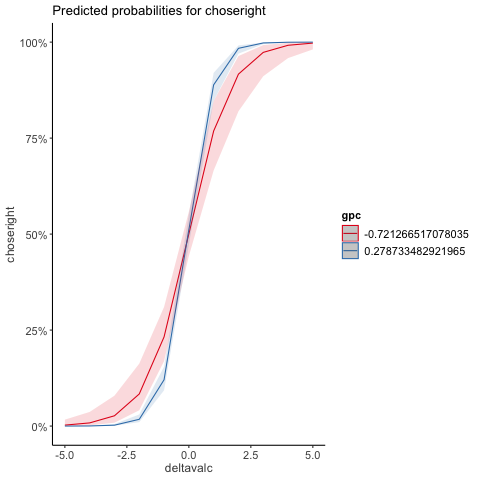

In [20]:
%%R
foodHC=read.delim('foodHC.csv',sep=',')
foodHC$group="Healthy"
foodMA=read.delim('foodMA.csv',sep=',')
foodMA$group="Amnesia"

food=rbind(foodHC,foodMA)
food$trial[food$run==2]=food$trial[food$run==2]+70
food$trial[food$run==3]=food$trial[food$run==3]+140
food$group=as.factor(food$group)
food$gp[food$group=='Healthy']=.5
food$gp[food$group=='Amnesia']=-.5
food$gpc=food$gp-mean(food$gp)
food$meanval=(food$ratingzLeft+food$ratingzRight)/2
food$meanvalc=food$meanval-mean(food$meanval)

food$deltavalc=food$deltaval-mean(food$deltaval)
food$absdeltavalc=abs(food$deltaval)-mean(abs(food$deltaval))
food$trialc=food$trial-mean(food$trial)


foodchoicemod=glmer(choseright ~ meanvalc * deltavalc * gpc + (deltavalc*meanvalc|subjectID), family='binomial', data=food)

nranpars <- length(getME(foodchoicemod,"theta"))
nfixpars <- length(fixef(foodchoicemod))
confintfoodchoicemod=confint(foodchoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)

save(foodchoicemod,confintfoodchoicemod, file = "foodchoicemod.RData")
load("foodchoicemod.RData")

print(summary(foodchoicemod))

print(confintfoodchoicemod)

plot_model(foodchoicemod,type='pred',terms=c('deltavalc','gpc'))

## Simple effect of $\Delta$Value on choices

In [21]:
%%R
foodMA=read.delim('foodMA.csv',sep=',')

foodMA$trial[foodMA$run==2]=foodMA$trial[foodMA$run==2]+70
foodMA$trial[foodMA$run==3]=foodMA$trial[foodMA$run==3]+140
foodMA$meanval=(foodMA$ratingzLeft+foodMA$ratingzRight)/2

foodMA$meanvalc=foodMA$meanval-mean(foodMA$meanval)
foodMA$deltavalc=foodMA$deltaval-mean(foodMA$deltaval)

foodMAchoicemod=glmer(choseright ~  deltavalc * meanvalc + (deltavalc*meanvalc||subjectID), family='binomial', data=foodMA)

nranpars <- length(getME(foodMAchoicemod,"theta"))
nfixpars <- length(fixef(foodMAchoicemod))
confintfoodMAchoicemod=confint(foodMAchoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)

save(foodMAchoicemod,confintfoodMAchoicemod,file="foodMAchoicemod.RData")
load("foodMAchoicemod.RData")

print(summary(foodMAchoicemod))
print('BOOTSTRAPPED CIs')
print(confintfoodMAchoicemod)

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Computing bootstrap confidence intervals ...

  warnings.warn(x, RRuntimeWarning)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltavalc * meanvalc + (deltavalc * meanvalc ||  
    subjectID)
   Data: foodMA

     AIC      BIC   logLik deviance df.resid 
  1183.9   1224.0   -583.9   1167.9     1110 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.4518 -0.6851  0.1220  0.7004  5.0470 

Random effects:
 Groups      Name               Variance Std.Dev.
 subjectID   (Intercept)        0.060876 0.24673 
 subjectID.1 deltavalc          0.009484 0.09738 
 subjectID.2 meanvalc           0.009092 0.09535 
 subjectID.3 deltavalc:meanvalc 0.060112 0.24518 
Number of obs: 1118, groups:  subjectID, 6

Fixed effects:
                   Estimate Std. Error z value Pr(>|z|)    
(Intercept)         0.05253    0.12446   0.422 0.672962    
deltavalc           1.15606    0.08966  12.894  < 2e-16 ***
meanvalc            0.01181    0.10440   0.113 0.909950    
deltavalc:mea

## Multilevel linear regression interaction model on value-based decision task RT data

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: logrt ~ absdeltavalc * meanvalc * gpc + trialc + (absdeltavalc *  
    meanvalc | subjectID)
   Data: food

REML criterion at convergence: 2087.5

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-21.4543  -0.6595  -0.0511   0.5903   3.4807 

Random effects:
 Groups    Name                  Variance  Std.Dev. Corr             
 subjectID (Intercept)           0.0186559 0.13659                   
           absdeltavalc          0.0013249 0.03640  -0.28            
           meanvalc              0.0020236 0.04498   0.20  0.36      
           absdeltavalc:meanvalc 0.0006162 0.02482   0.15  0.91  0.50
 Residual                        0.0944882 0.30739                   
Number of obs: 4011, groups:  subjectID, 20

Fixed effects:
                            Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)                2.164e-01  3.101e-02  1.808e+01   6.980 1.5

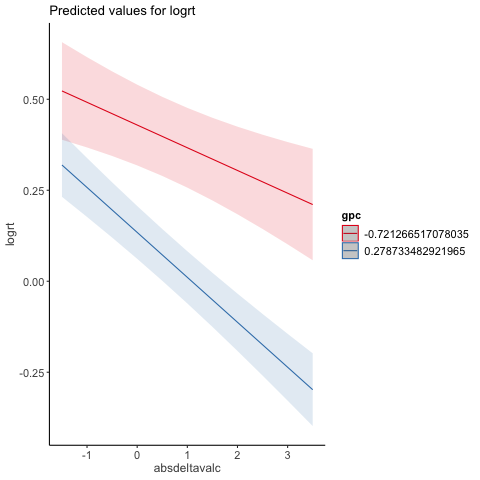

In [22]:
%%R
food$logrt=log(food$RT)

foodrtmod=lmer(logrt ~ absdeltavalc * meanvalc * gpc + trialc + (absdeltavalc*meanvalc|subjectID), data=food)

nranpars <- length(getME(foodrtmod,"theta"))
nfixpars <- length(fixef(foodrtmod))
confintfoodrtmod=confint(foodrtmod,method="boot", nsim=1000, parm=(nranpars+2):(nranpars+nfixpars+1), parallel="multicore", ncpus=8)

save(foodrtmod,confintfoodrtmod, file = "foodrtmod.RData")
load("foodrtmod.RData")

print(summary(foodrtmod))
print("BOOTSTRAPPED CIs")
print(confintfoodrtmod)

plot_model(foodrtmod,type='pred',terms=c('absdeltavalc','gpc'),show.ci=T)

## Speed/accuracy measures
### Figure 5C, Figure 5D

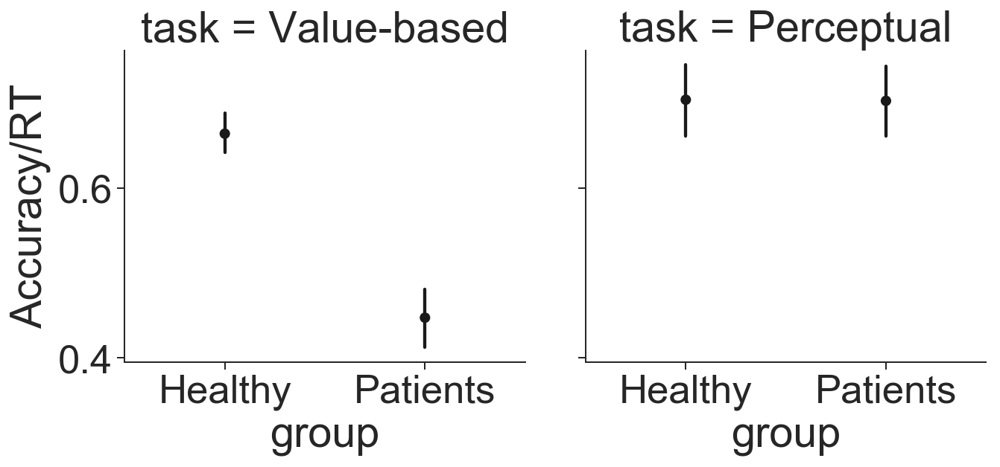

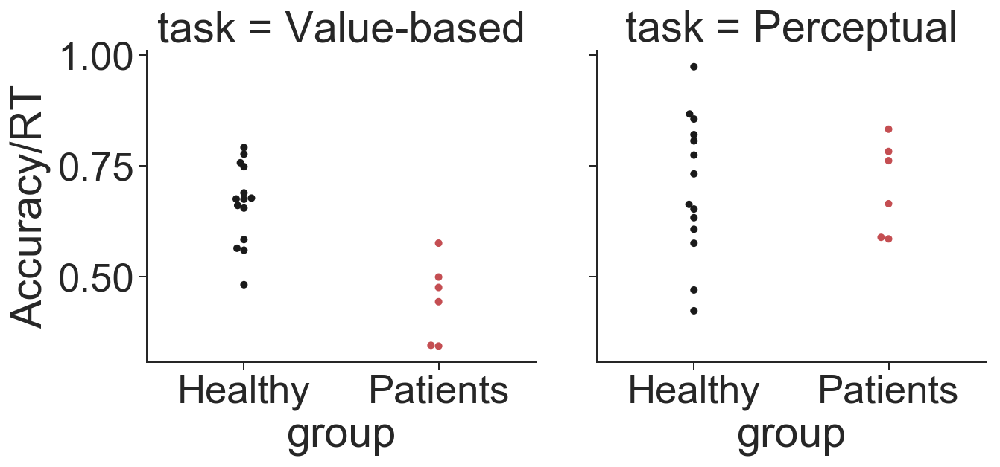

In [23]:
dotsMA=pd.read_csv("dotsMA.csv")
dotsMA=dotsMA[dotsMA.color_coh!=0]
dotsHC=pd.read_csv("dotsHC.csv")
dotsHC=dotsHC[dotsHC.color_coh!=0]

RTMAdots=dotsMA.groupby('subjid').mean().RT
RTHCdots=dotsHC.groupby('subjid').mean().RT

ciMAdots=dotsMA.groupby('subjid').mean().outcome
ciHCdots=dotsHC.groupby('subjid').mean().outcome

MAdotsratio=ciMAdots/RTMAdots
HCdotsratio=ciHCdots/RTHCdots

foodMA=pd.read_csv("foodMA.csv")
foodMA=foodMA[foodMA.deltavalrnd!=0]
foodHC=pd.read_csv("foodHC.csv")
foodHC=foodHC[foodHC.deltavalrnd!=0]

RTMAfood=foodMA.groupby('subjectID').mean().RT
RTHCfood=foodHC.groupby('subjectID').mean().RT

ciMAfood=foodMA.groupby('subjectID').mean().Outcome
ciHCfood=foodHC.groupby('subjectID').mean().Outcome

MAfoodratio=ciMAfood/RTMAfood
HCfoodratio=ciHCfood/RTHCfood

df=pd.DataFrame({'subjid':np.append(np.append(foodHC.subjectID.unique(),foodHC.subjectID.unique()),np.append(foodMA.subjectID.unique(),foodMA.subjectID.unique())),
                 'group':np.append(np.repeat('Healthy',len(foodHC.subjectID.unique())*2),np.repeat('Patients',len(foodMA.subjectID.unique())*2)),
                 'task':np.append(np.append(np.repeat('Value-based',len(foodHC.subjectID.unique())),np.repeat('Perceptual',len(foodHC.subjectID.unique()))),
                                  np.append(np.repeat('Value-based',len(foodMA.subjectID.unique())),np.repeat('Perceptual',len(foodMA.subjectID.unique())))),
                 'Accuracy/RT':np.append(np.append(HCfoodratio,HCdotsratio),np.append(MAfoodratio,MAdotsratio))})

sns.set(context='paper', style='white',font_scale=3)
sns.set_style('ticks')
sns.catplot(x='group',y='Accuracy/RT',col='task',data=df,color='k',ci=68,kind="point", join=False)
sns.catplot(x='group',y='Accuracy/RT',col='task',data=df,palette=['k','r'],kind='swarm')
sns.despine()
plt.tight_layout()
plt.show()

## Significance test for Accuracy/RT for Perceptual decisions

In [24]:
scipy.stats.ttest_ind(HCdotsratio,MAdotsratio, equal_var=False)

Ttest_indResult(statistic=0.021772517556836308, pvalue=0.98293243650014817)

In [25]:
#DOF
var1=scipy.var(HCdotsratio)
N1=len(HCdotsratio)
var2=scipy.var(MAdotsratio)
N2=len(MAdotsratio)

df=(var1/N1+var2/N2)**2/((var1**2/(N1**2*N1-1))+((var2**2/(N2**2*N2-1))))
print('Degrees of freedom for Percetual Accucary/RT Welch`s t-test = '+str(df))

Degrees of freedom for Percetual Accucary/RT Welch`s t-test = 17.206862236560514


In [26]:
scipy.stats.mannwhitneyu(HCdotsratio,MAdotsratio)

MannwhitneyuResult(statistic=41.0, pvalue=0.48355255974916556)

## Significance test for Accuracy/RT for Value-based decisions

In [27]:
scipy.stats.ttest_ind(HCfoodratio,MAfoodratio, equal_var=False)

Ttest_indResult(statistic=4.9015450078181662, pvalue=0.00072343894945983451)

In [28]:
#DOF
var1=scipy.var(HCfoodratio)
N1=len(HCfoodratio)
var2=scipy.var(MAfoodratio)
N2=len(MAfoodratio)

df=(var1/N1+var2/N2)**2/((var1**2/(N1**2*N1-1))+((var2**2/(N2**2*N2-1))))
print('Degrees of freedom for Value-based Accucary/RT Welch`s t-test = '+str(df))

Degrees of freedom for Value-based Accucary/RT Welch`s t-test = 11.83698521015427


In [29]:
scipy.stats.mannwhitneyu(HCfoodratio,MAfoodratio)

MannwhitneyuResult(statistic=4.0, pvalue=0.00099089471890495898)

## Load in ratings data for HC

In [30]:
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_food_rating_run1*m.txt')

# load rating data into dataframe
rating1HC=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    rating1HC=pd.concat([rating1HC,tmp],ignore_index=True)

# make list of rating data files
filelist=[]
for s in subjidHC:
    filelist=filelist+glob.glob(datapath+'NC'+str(s)+'_food_rating_run2*m.txt')

# load rating data into dataframe
ratingHC=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    ratingHC=pd.concat([ratingHC,tmp],ignore_index=True)

for s in rating1HC.subjectID.unique():
    tmp=rating1HC[rating1HC.subjectID==s]
    for i in tmp.itemName.unique():
        rating1HC.loc[(rating1HC.subjectID==s)&(rating1HC.itemName==i), 'rating2']=ratingHC.loc[(ratingHC.subjectID==s)&(ratingHC.itemName==i), 'rating'].values[0]

ratingHC=rating1HC
# exclude the same items that participant 444 did not recognize or misnamed
include=(((ratingHC.subjectID=='NC444') & ((ratingHC.itemName != "apple_slices.jpg") & (ratingHC.itemName != "avocado.jpg") & (ratingHC.itemName != "grilled_cheese.jpg"))) | 
         (ratingHC.subjectID != 'NC444'))    
ratingHC = ratingHC[include]    
        
ratingHC.to_csv('ratingsHC.csv')

## Load in ratings data for Amnesics

In [31]:
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_food_rating_run1*m.txt')

# load rating data into dataframe
rating1MA=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    rating1MA=pd.concat([rating1MA,tmp],ignore_index=True)

# make list of rating data files
filelist=[]
for s in subjidMA:
    filelist=filelist+glob.glob(datapath+'MA0'+str(s)+'_food_rating_run2*m.txt')

# load rating data into dataframe
ratingMA=pd.read_table(filelist[0],sep="\s+")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep="\s+")
    ratingMA=pd.concat([ratingMA,tmp],ignore_index=True)

for s in rating1MA.subjectID.unique():
    tmp=rating1MA[rating1MA.subjectID==s]
    for i in tmp.itemName.unique():
        rating1MA.loc[(rating1MA.subjectID==s)&(rating1MA.itemName==i), 'rating2']=ratingMA.loc[(ratingMA.subjectID==s)&(ratingMA.itemName==i), 'rating'].values[0]

ratingMA=rating1MA
# exclude the same items that patients 62, 46, and 35 did not recognize or misnamed
include1=(((ratingMA.subjectID=='MA062') & ((ratingMA.itemName != "cherry_tomato.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "bagel_plain.jpg") & (ratingMA.itemName != "cherries.jpg"))) | 
         (ratingMA.subjectID != 'MA062'))
include2=(((ratingMA.subjectID=='MA046') & ((ratingMA.itemName != "cherries.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "grilled_cheee.jpg"))) | 
         (ratingMA.subjectID != 'MA046'))
include3=(((ratingMA.subjectID=='MA035') & ((ratingMA.itemName != "burger.jpg") & (ratingMA.itemName != "avocado.jpg") & (ratingMA.itemName != "burger.jpg"))) | 
         (ratingMA.subjectID != 'MA035'))
include=include1 & include2 & include3
ratingMA = ratingMA.loc[include]  

ratingMA.to_csv('ratingsMA.csv')

## Plot distribution of value ratings
### Figure 5—figure supplement 3A

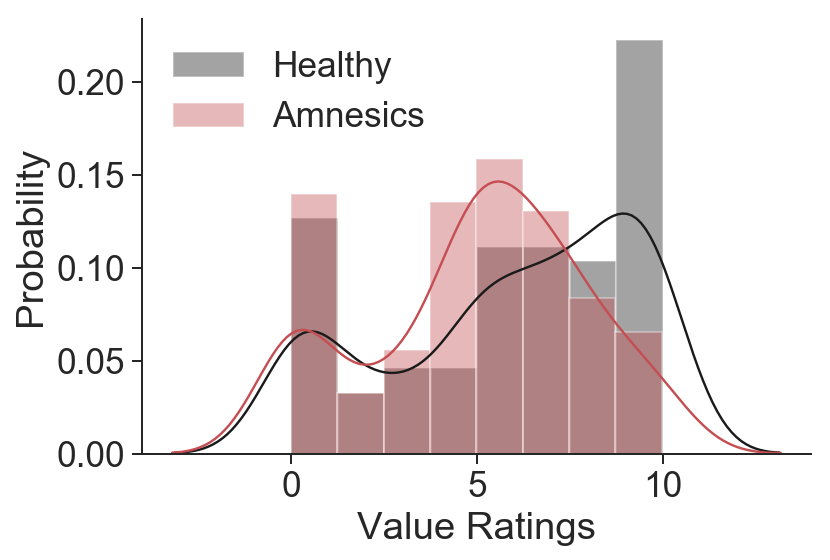

In [32]:
ratingsMA=pd.read_csv('ratingsMA.csv')
ratingsHC=pd.read_csv('ratingsHC.csv')

sns.set(context='paper',style='white',font_scale=2)
sns.set_style('ticks')
sns.distplot(ratingsHC.rating,color='k')
sns.distplot(ratingsMA.rating,color='r')
plt.xlabel('Value Ratings')
plt.ylabel('Probability')
plt.legend(['Healthy','Amnesics'],frameon=False)
sns.despine()
plt.savefig('plots/ratings_histogram.pdf',dpi=300,format='pdf')
plt.show()

## Plot distribution of $\Delta$Value
### Figure 5—figure supplement 3B

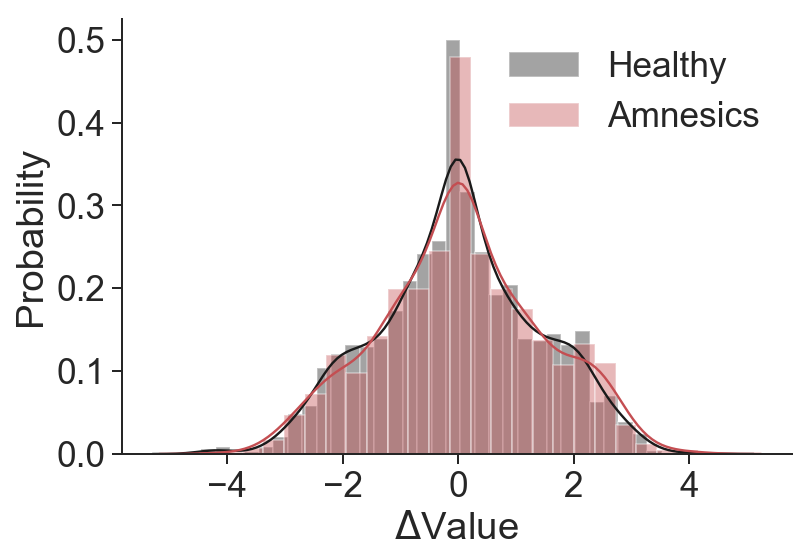

In [33]:
foodMA=pd.read_csv('foodMA.csv')
foodHC=pd.read_csv('foodHC.csv')

sns.distplot(foodHC.deltaval,color='K')
sns.distplot(foodMA.deltaval,color='r')
plt.ylabel('Probability')
plt.xlabel(r'$\Delta$'+'Value')
plt.legend(['Healthy','Amnesics'],frameon=False)
sns.despine()
plt.savefig('plots/deltavalue_histogram.pdf',dpi=300,format='pdf')
plt.show()

## Function to plot individual participant perceptual data with fit

In [34]:
def plotDotsDataWithFitSub(data1, theta1, plotcolor='k', subnum='X00', dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    ustim_strengths1 = np.unique(stim_strengths1) 
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]
    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
    
    
    # calculate participant means per subject
    smean1 = df1.groupby('stim_strength',as_index=False).mean()
    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']
    
    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']
    
    
    # predicted proportions
    predprop1 = D1['up']['p'][:]
    
    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    
    del bothmeans1['ci'] 
        
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
    
        
    

    predrt_both1 = D1['both']['mean_t'][0] + tnd1
    

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color=plotcolor,
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color=plotcolor))

    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond blue)',fontsize='large')
    ax_choice.set_title('Perceptual decisions for \n participant '+subnum,fontsize='x-large')
    
    ax_choice.text(1,.3,'N = '+str(len(ci1)),fontsize='large')
    
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)

    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color=plotcolor, linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color=plotcolor, marker='None'))

    ax_rt.set_xlabel('Color coherence (log(blue/yellow))',fontsize='large')
    ax_rt.set_ylabel('Reaction time (s)',fontsize='large')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    #ax_rt.set_ylim(df1.rt.min()-semrt_both1.max(),df1.rt.max()-semrt_both1.max())

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/perceptual/sub'+subnum+'.pdf', dpi=300,format='pdf')
    plt.show()
    

## Fit individual participant perceptual task data

In [35]:
def do_fit_dotsHCsub(i):
    dots=pd.read_csv('dotsHC.csv')
    uni_sub=dots.subjid.unique()
    s=uni_sub[i]
    dotssub=dots[dots['subjid']==s]
    datadots=np.column_stack([dotssub['color_coh'],dotssub['RT'],dotssub['choseblue']])
    [thetadotssub,fopt]=fitData(datadots)
    tmp=thetadotssub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    return tmp

dotsHC=pd.read_csv('dotsHC.csv')
# run fits in parallel
inputs = range(len(dotsHC['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_dotsHCsub)(i) for i in inputs)
    
thetadotsHCallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetadotsHCallsub,open("thetadotsHCallsub.p","wb"))


def do_fit_dotsMAsub(i):
    dots=pd.read_csv('dotsMA.csv')
    uni_sub=dots.subjid.unique()
    s=uni_sub[i]
    dotssub=dots[dots['subjid']==s]
    datadots=np.column_stack([dotssub['color_coh'],dotssub['RT'],dotssub['choseblue']])
    [thetadotssub,fopt]=fitData(datadots)
    tmp=thetadotssub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    return tmp

dotsMA=pd.read_csv('dotsMA.csv')
# run fits in parallel
inputs = range(len(dotsMA['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_dotsMAsub)(i) for i in inputs)
    
thetadotsMAallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetadotsMAallsub,open("thetadotsMAallsub.p","wb"))

## Plot individual participant perceptual task data and fit
### Figure 5—figure supplement 1

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


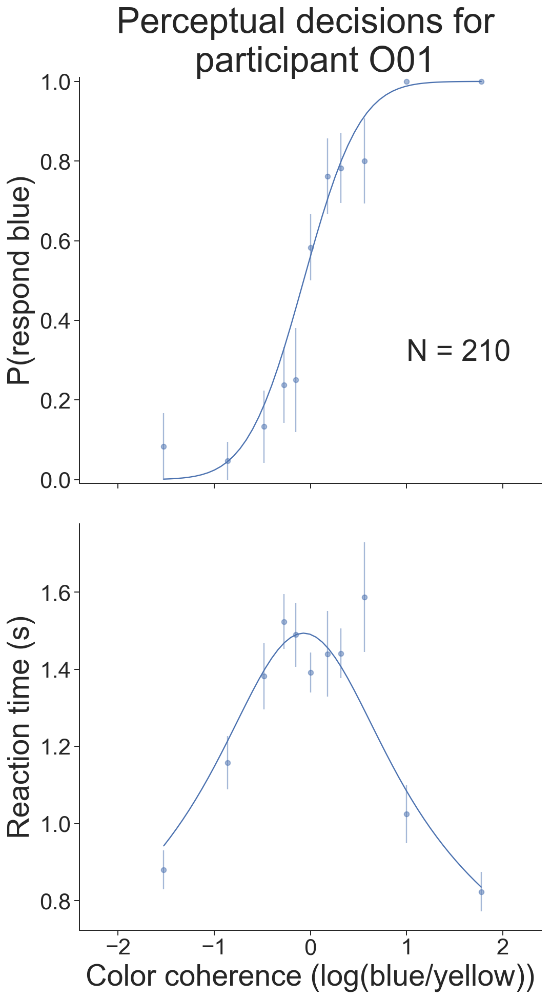

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


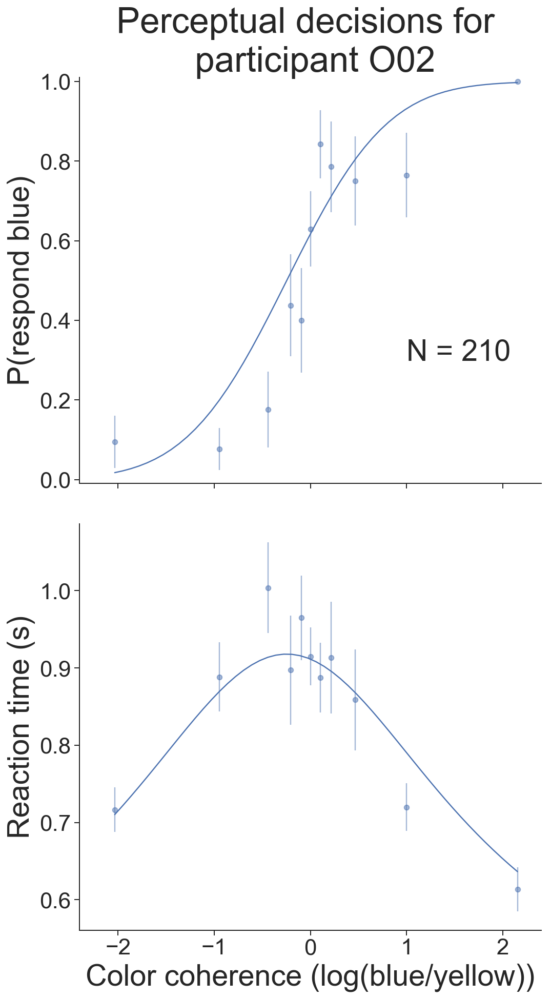

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


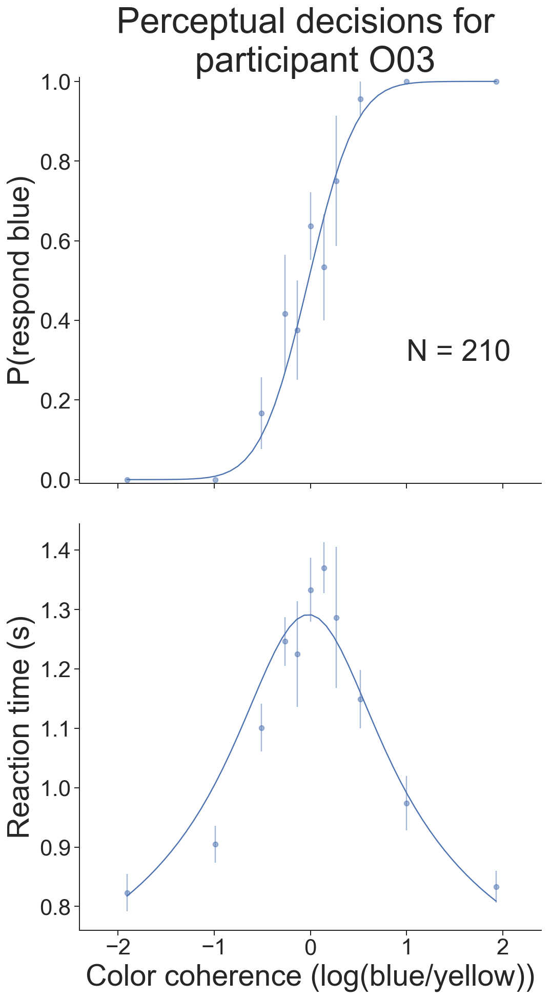

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


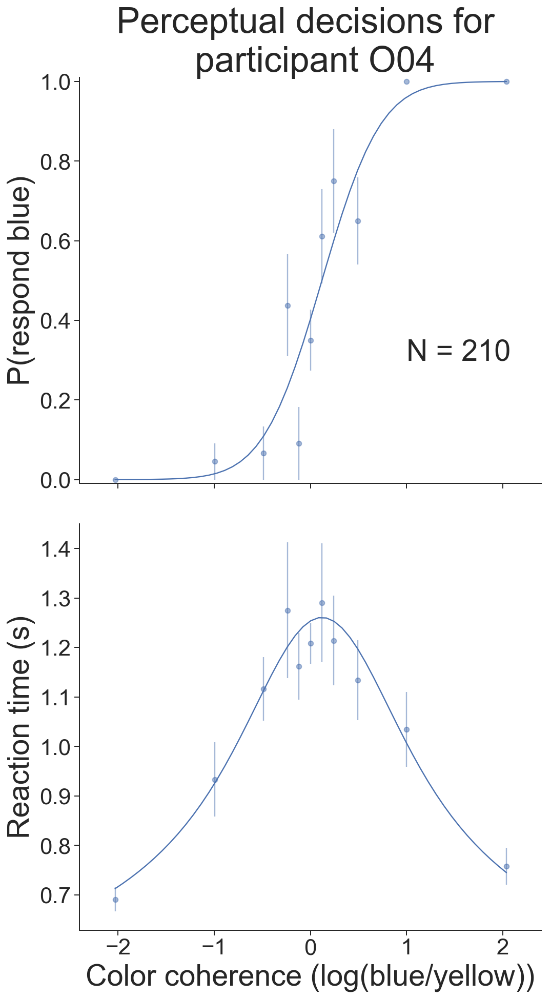

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


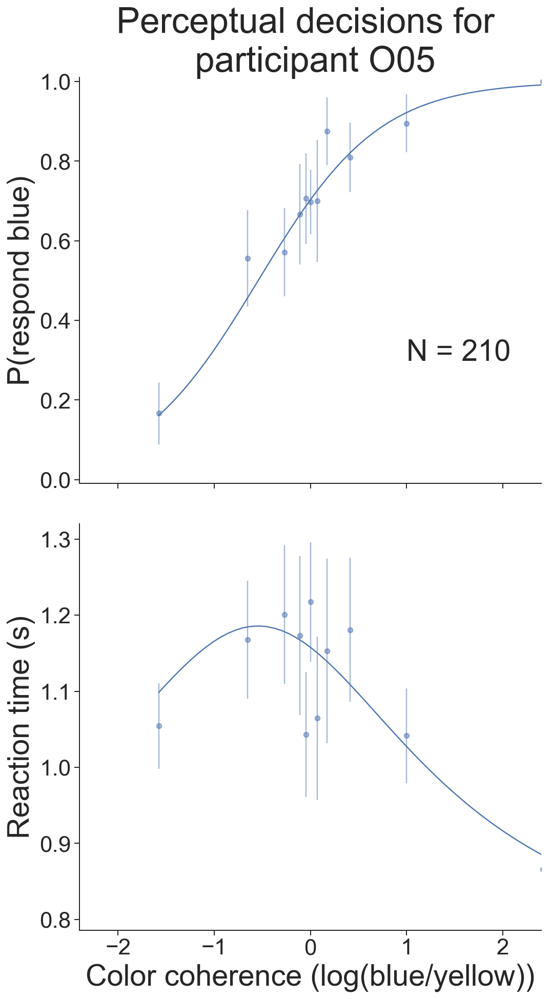

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


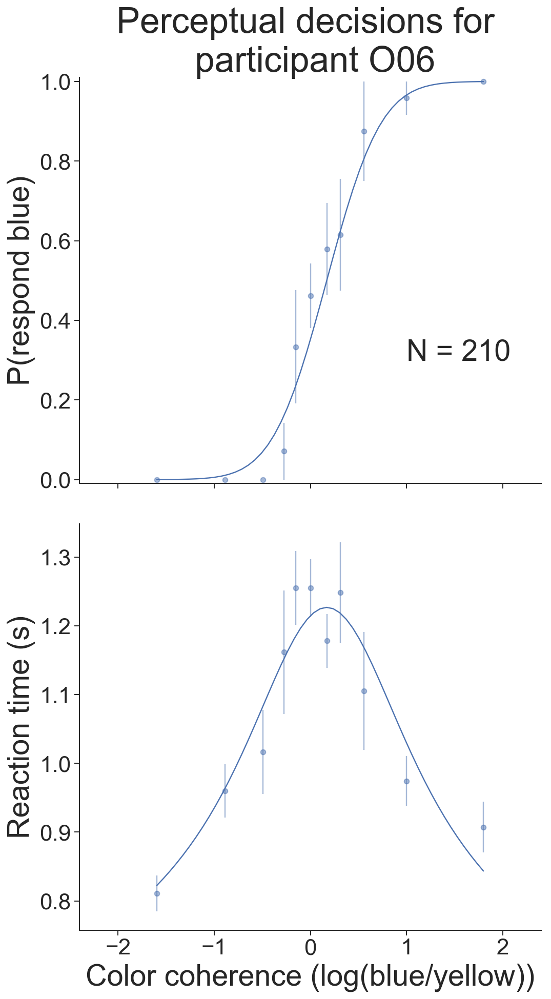

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


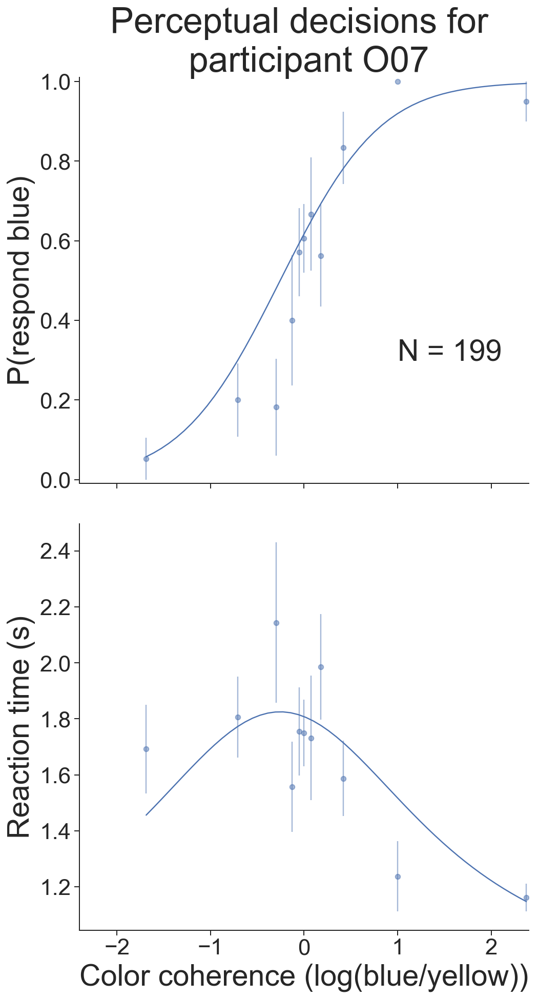

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


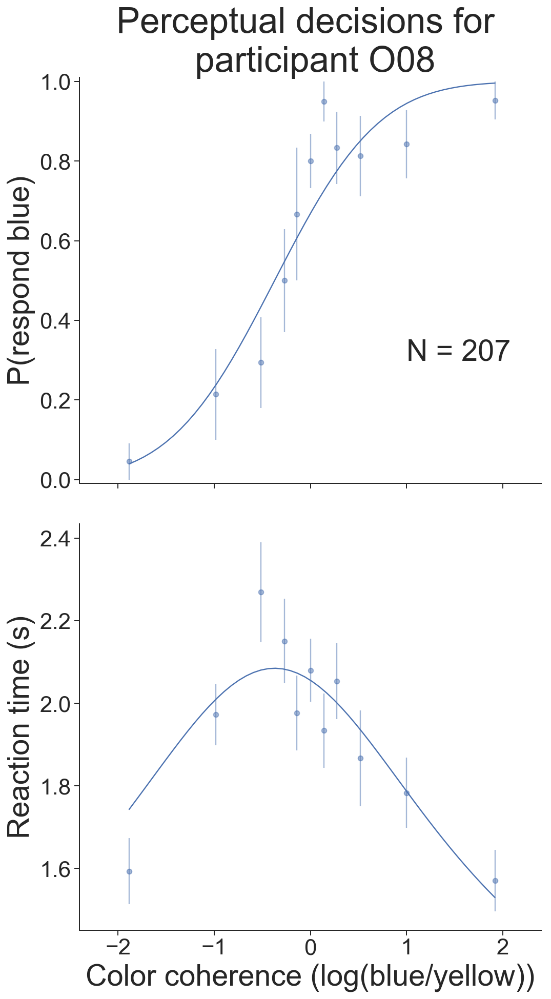

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


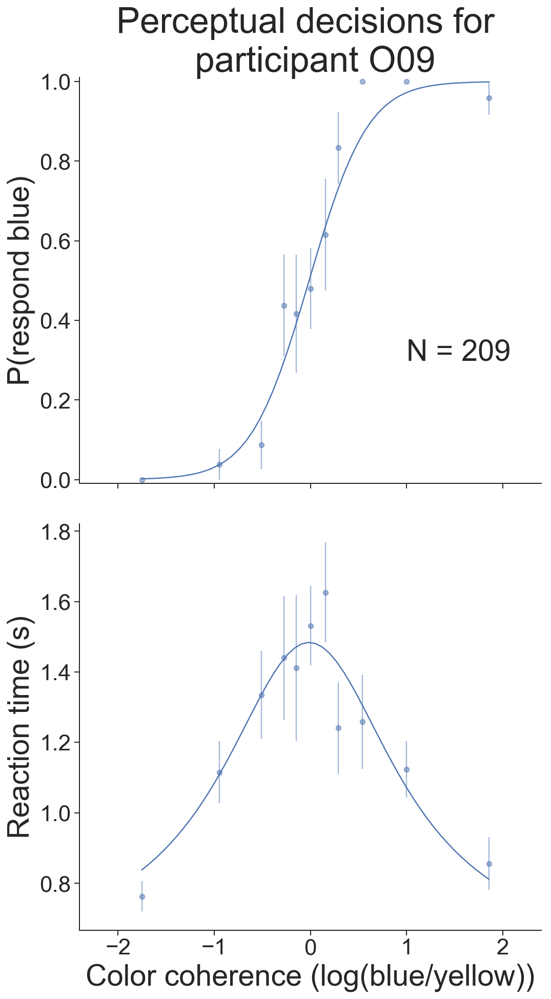

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


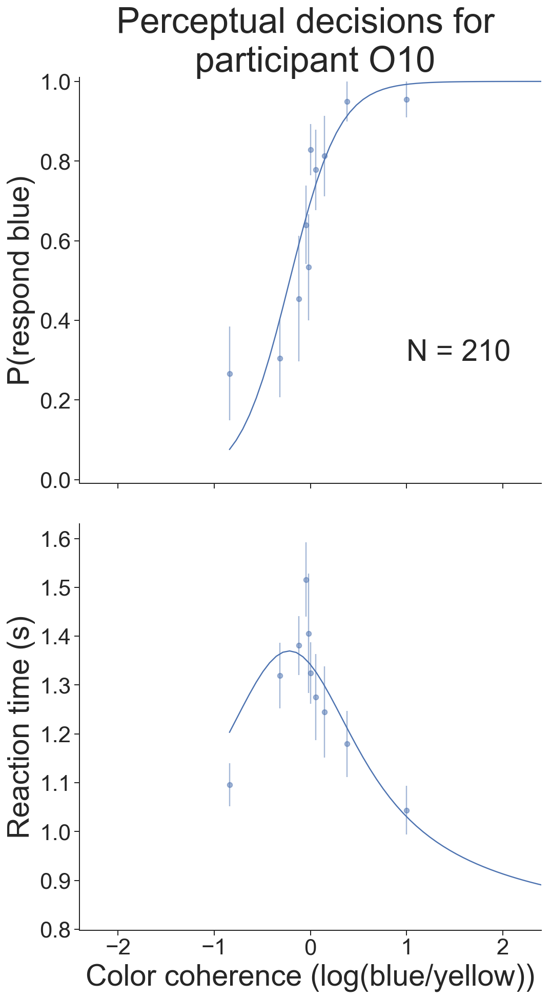

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


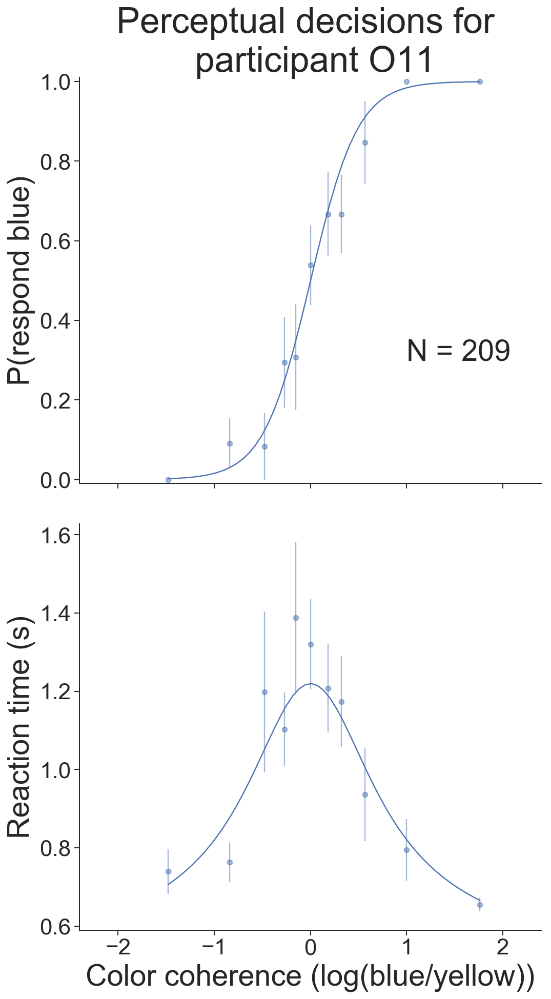

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


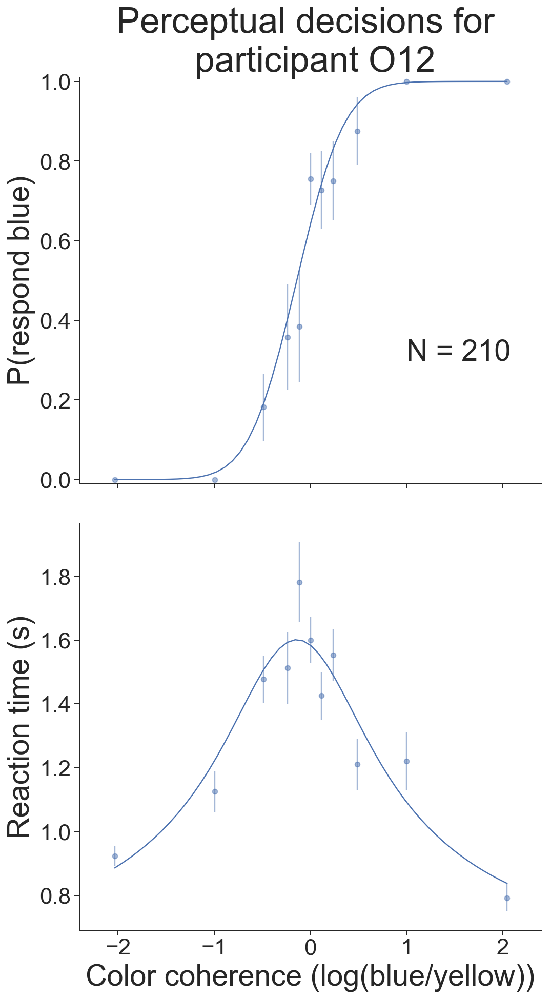

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


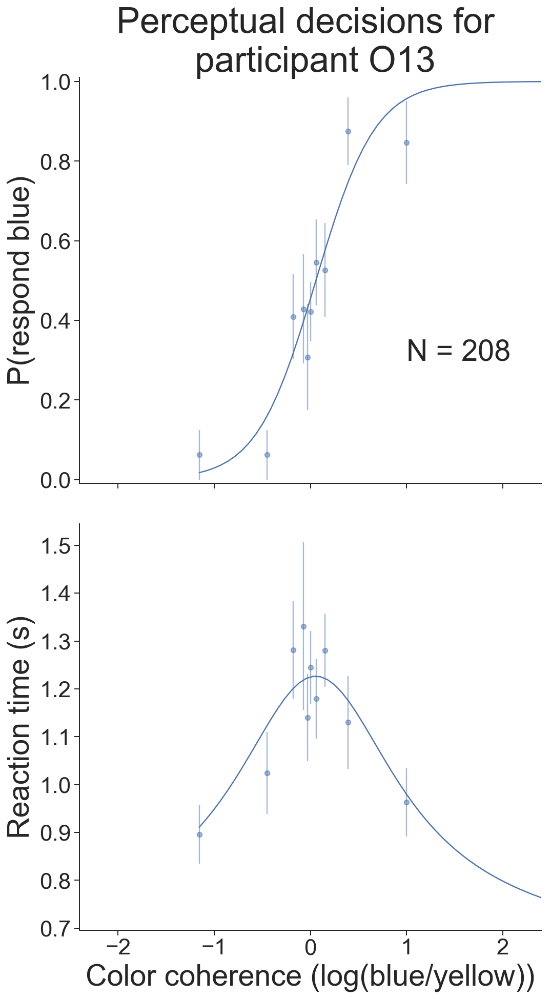

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


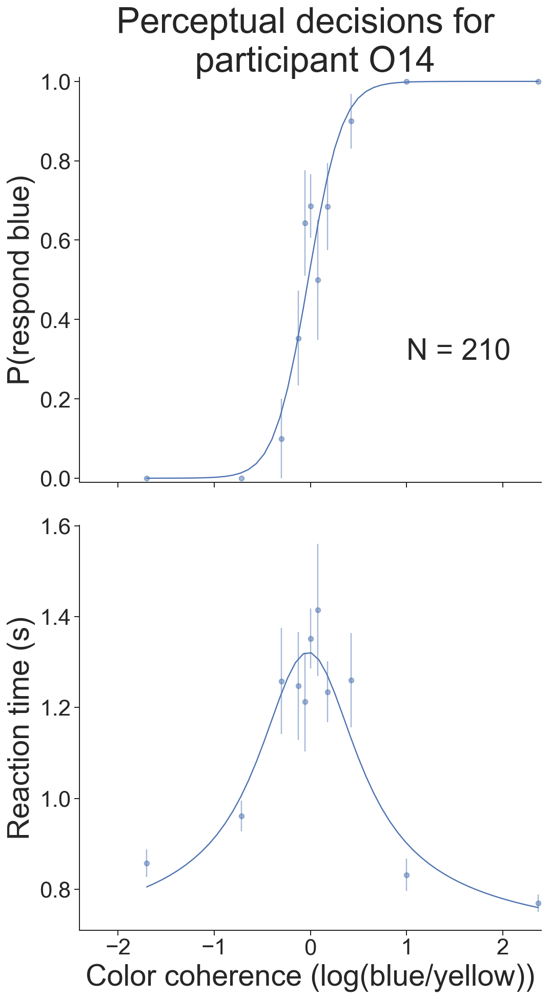

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


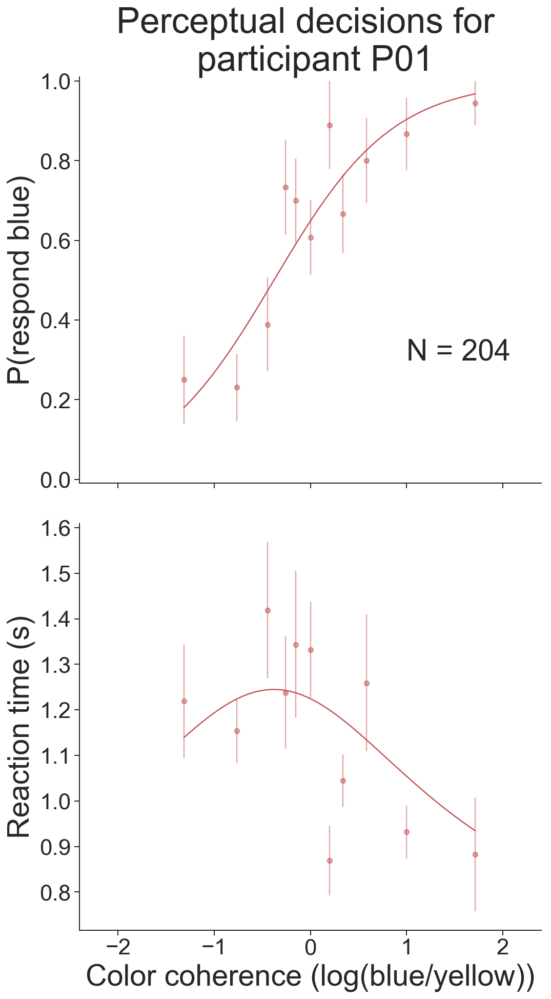

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


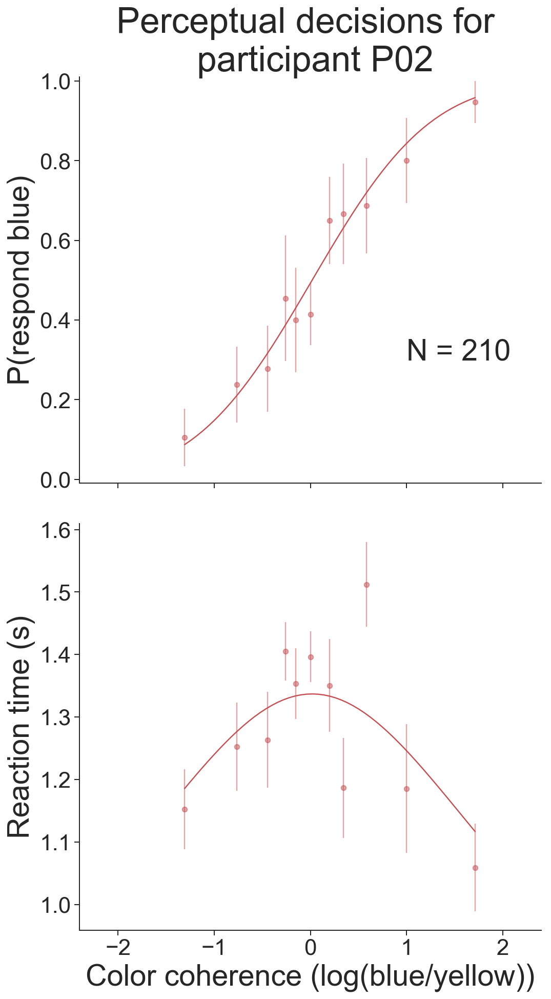

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


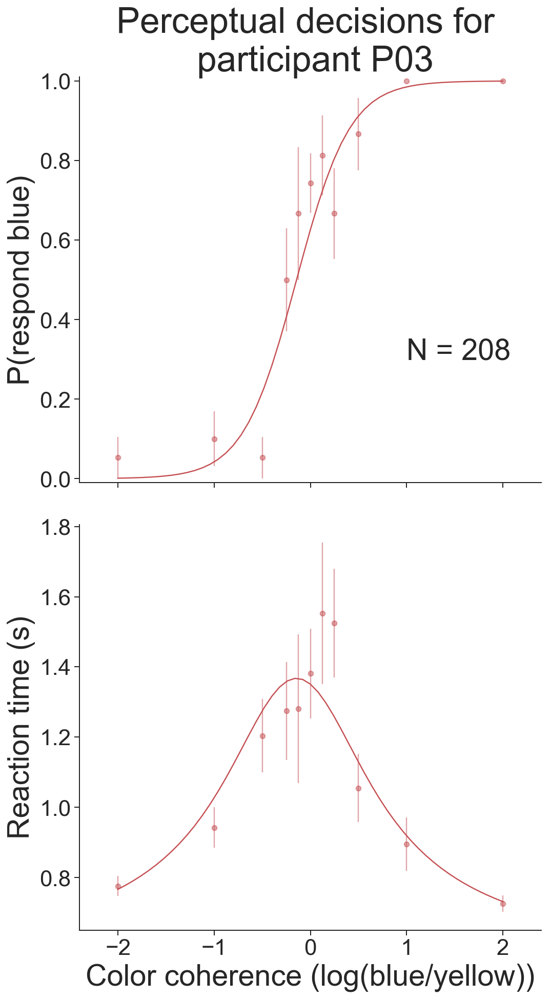

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


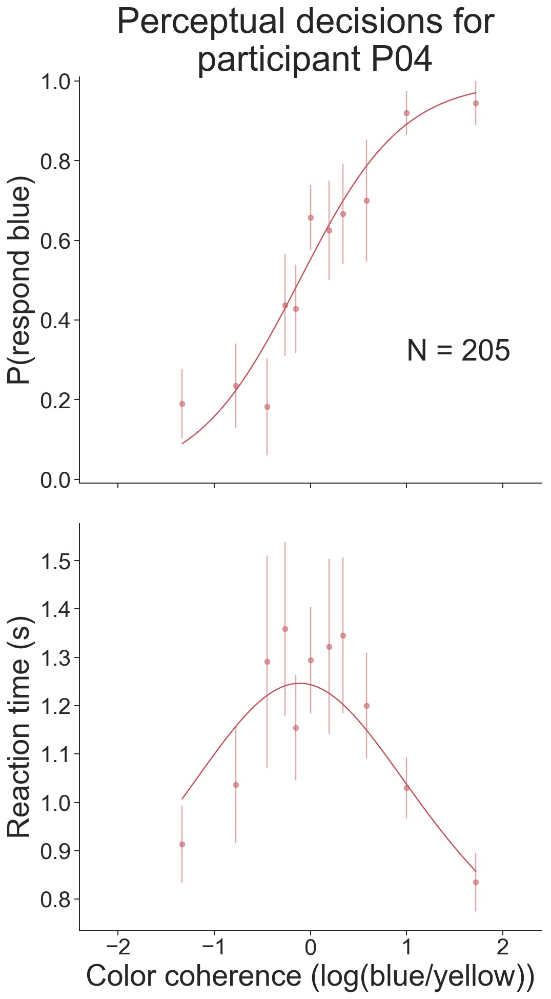

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


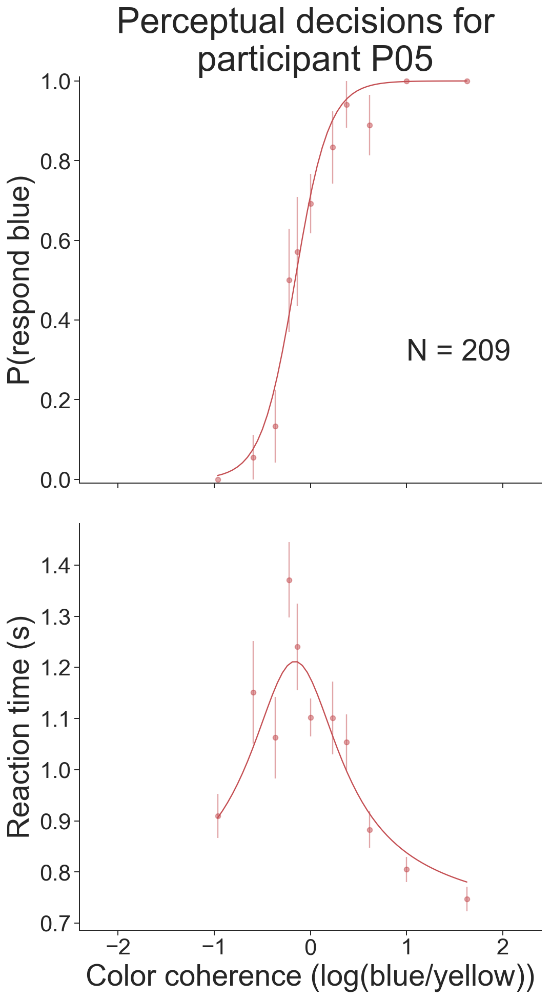

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


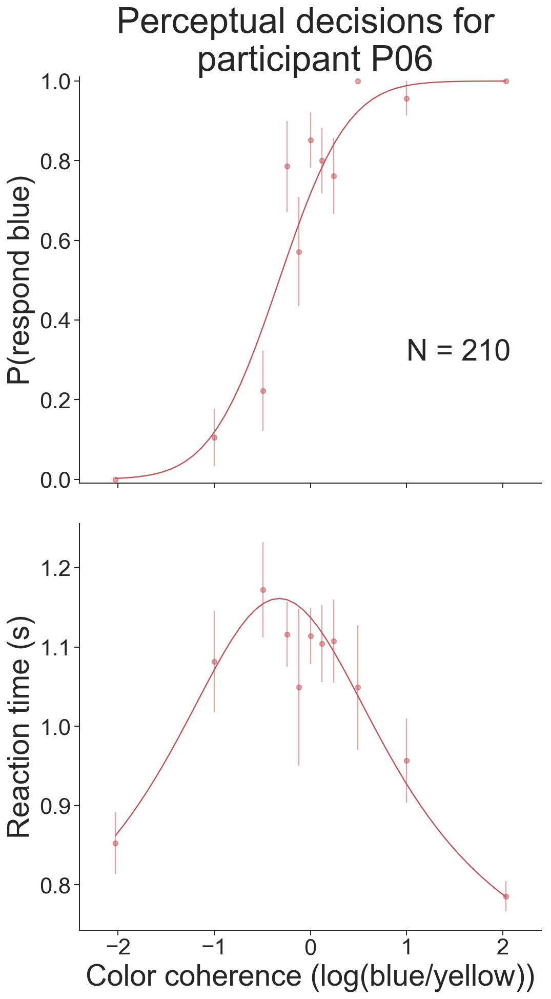

In [35]:
thetadotsHCallsub=pickle.load(open('thetadotsHCallsub.p','rb'))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
dotsHC=pd.read_csv("dotsHC.csv")
subnum=1

for s in dotsHC.subjid.unique():
    dotsHCsub=dotsHC[dotsHC.subjid==s]
    data1=np.column_stack([dotsHCsub['color_coh'],dotsHCsub['RT'],dotsHCsub['choseblue'],dotsHCsub['subjid']])
    theta1=thetadotsHCallsub[thetadotsHCallsub.subjid==s].values[0][:9]
    plotDotsDataWithFitSub(data1, theta1, plotcolor='b', subnum='O'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1

thetadotsMAallsub=pickle.load(open('thetadotsMAallsub.p','rb'))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
dotsMA=pd.read_csv("dotsMA.csv")
subnum=1

for s in dotsMA.subjid.unique():
    dotsMAsub=dotsMA[dotsMA.subjid==s]
    data1=np.column_stack([dotsMAsub['color_coh'],dotsMAsub['RT'],dotsMAsub['choseblue'],dotsMAsub['subjid']])
    theta1=thetadotsMAallsub[thetadotsMAallsub.subjid==s].values[0][:9]
    plotDotsDataWithFitSub(data1, theta1, plotcolor='r', subnum='P'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1

## Function to plot individual participant food choice data

In [36]:
def plotFoodDataWithFitsub(data1, theta1, plotcolor='k', subnum='X00' ,dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1 = data1[:, 0], data1[:, 1], data1[:, 2]
 
    bins1=10#np.int(len(ci1)/20)

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    ustim_strengths1 = np.unique(stim_strengths1)
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)
    
    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')


    dfsorted1=df1.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop1 = pd.Series.rolling(dfsorted1['ci'],bins1,min_periods=np.int(bins1/2),center=True).mean()
    
    # predicted proportions
    predprop1 = D1['up']['p'][:]

    #chose right or chose left
    cr1=dfsorted1[dfsorted1['ci']==1]
    cl1=dfsorted1[dfsorted1['ci']==0]


    #running mean of rt
    meanrt_lo1 = pd.Series.rolling(cl1['rt'],50,min_periods=50).mean()
    meanrt_up1 = pd.Series.rolling(cr1['rt'],50,min_periods=50).mean()
    meanrt_both1 = pd.Series.rolling(dfsorted1['rt'],bins1,min_periods=np.int(bins1),center=True).mean()

    predrt_up1 = D1['up']['mean_t'][0] + tnd1
    predrt_lo1 = D1['lo']['mean_t'][0] + tnd1
    predrt_both1 = D1['both']['mean_t'][0] + tnd1

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.add_line(
        plt.Line2D(dfsorted1['deltaval'], meanprop1, color=plotcolor,alpha=0.5))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color=plotcolor))

    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond right)',fontsize='large')
    ax_choice.set_title('Value-based decisions for \n participant '+subnum,fontsize='x-large')
    
    ax_choice.text(1,.3,'N = '+str(len(ci1)),fontsize='large')
    
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ax_rt.add_line(
        plt.Line2D(dfsorted1['deltaval'], meanrt_both1, color=plotcolor,alpha=0.5))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color=plotcolor, marker='None'))

    ax_rt.set_xlabel(r'$\Delta$'+'Value (right - left)',fontsize='large')
    ax_rt.set_ylabel('Reaction time (s)',fontsize='large')

    #ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(np.nanmin(meanrt_both1), np.nanmax(meanrt_both1))
    #ax_rt.set_ylim(.8,1.9)

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/value_based/sub'+subnum+'.pdf', dpi=300,format='pdf')
    plt.show()
    

## Fit individual participant value-based decision task data

In [37]:
def do_fit_foodHCsub(i):
    food=pd.read_csv('foodHC.csv')
    uni_sub=food.subjid.unique()
    s=uni_sub[i]
    foodsub=food[food['subjectID']==s]
    datafood=np.column_stack([foodsub['deltavalbinv'],foodsub['RT'],foodsub['choseright']])
    [thetafoodsub,fopt]=fitData(datafood)
    tmp=thetafoodsub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    return tmp

foodHC=pd.read_csv('foodHC.csv')
# run fits in parallel
inputs = range(len(foodHC['subjectID'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_foodHCsub)(i) for i in inputs)
    
thetafoodHCallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetafoodHCallsub,open("thetafoodHCallsub.p","wb"))


def do_fit_foodMAsub(i):
    food=pd.read_csv('foodMA.csv')
    uni_sub=food.subjid.unique()
    s=uni_sub[i]
    foodsub=food[food['subjectID']==s]
    datafood=np.column_stack([foodsub['deltavalbinv'],foodsub['RT'],foodsub['choseright']])
    [thetafoodsub,fopt]=fitData(datafood)
    tmp=thetafoodsub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    return tmp

foodMA=pd.read_csv('foodMA.csv')
# run fits in parallel
inputs = range(len(foodMA['subjectID'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_foodMAsub)(i) for i in inputs)
    
thetafoodMAallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetafoodMAallsub,open("thetafoodMAallsub.p","wb"))

## Plot individual participant perceptual task data and fit
### Figure 5—figure supplement 1

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


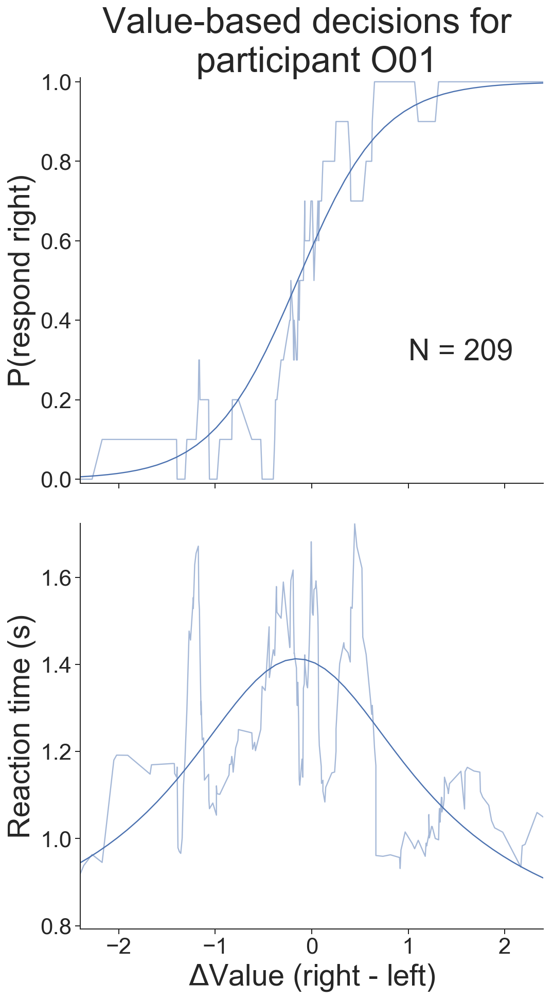

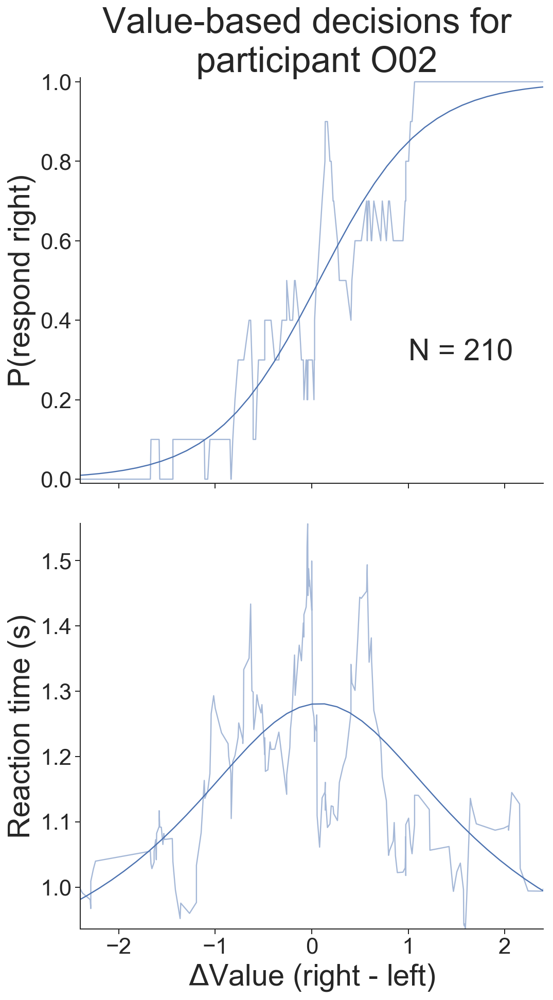

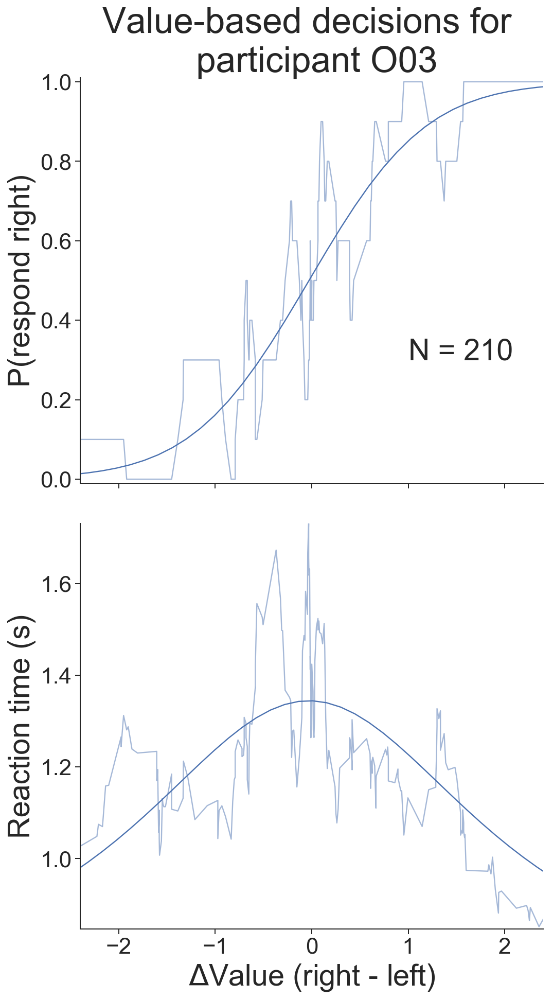

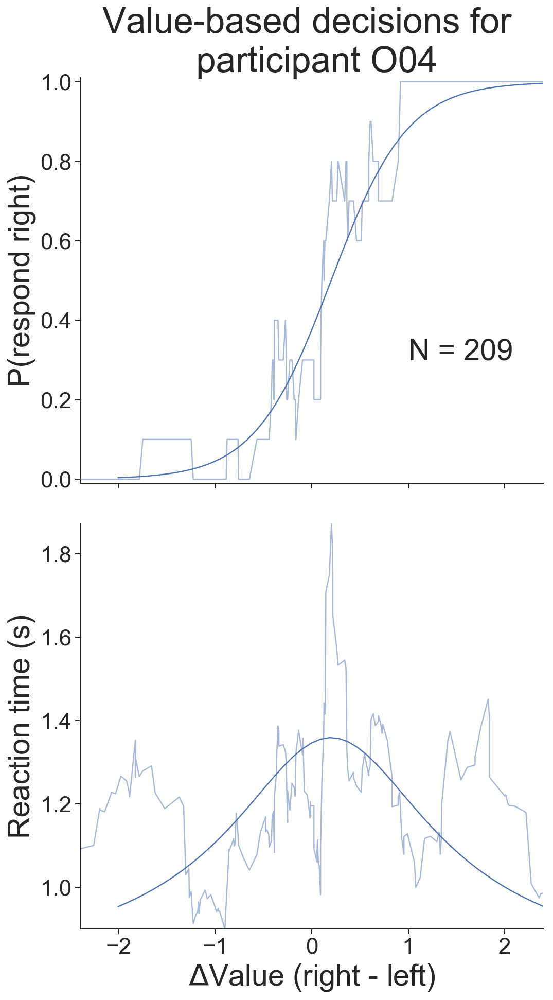

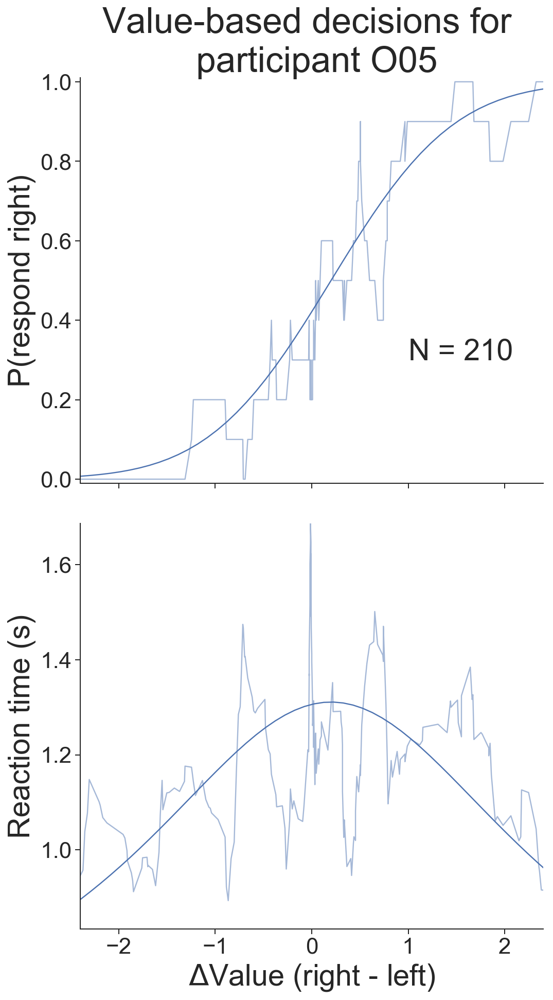

...

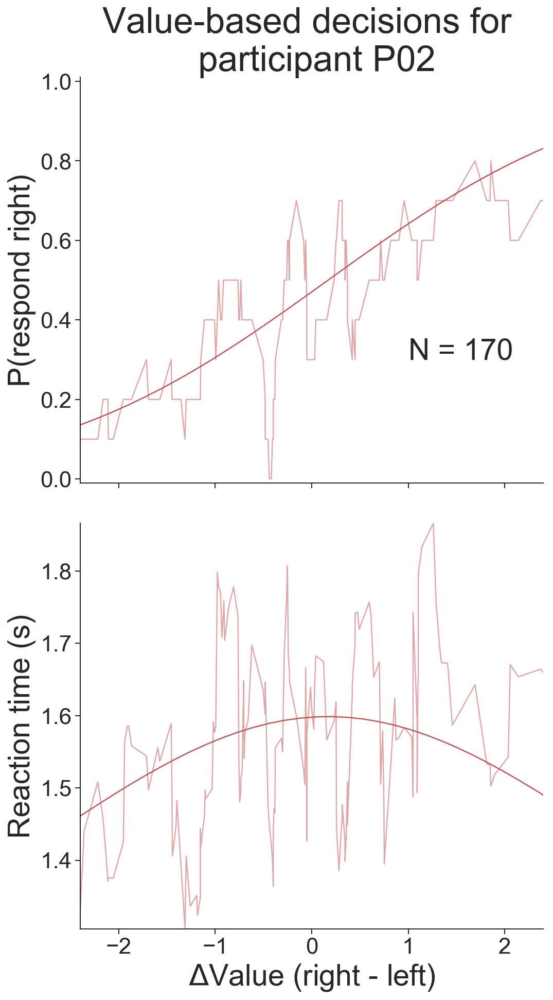

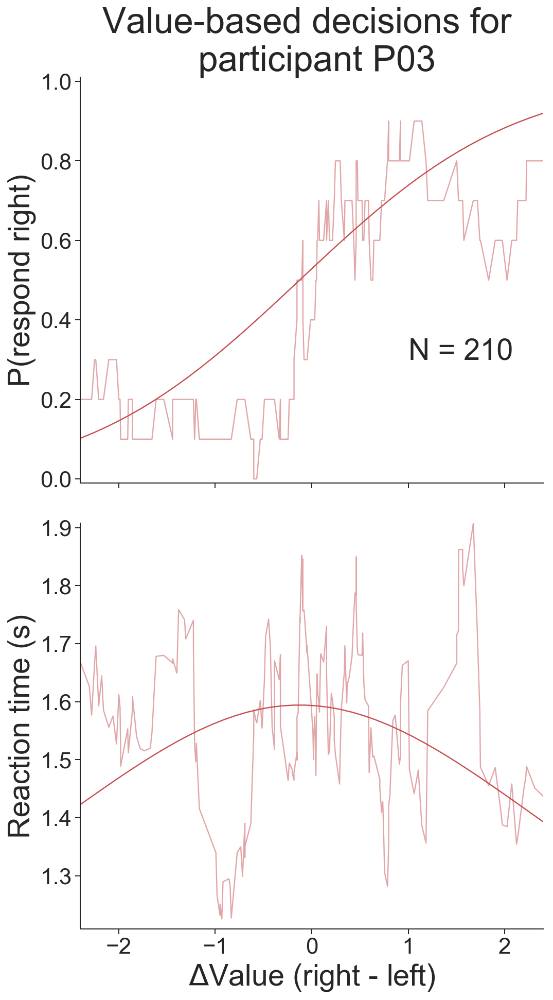

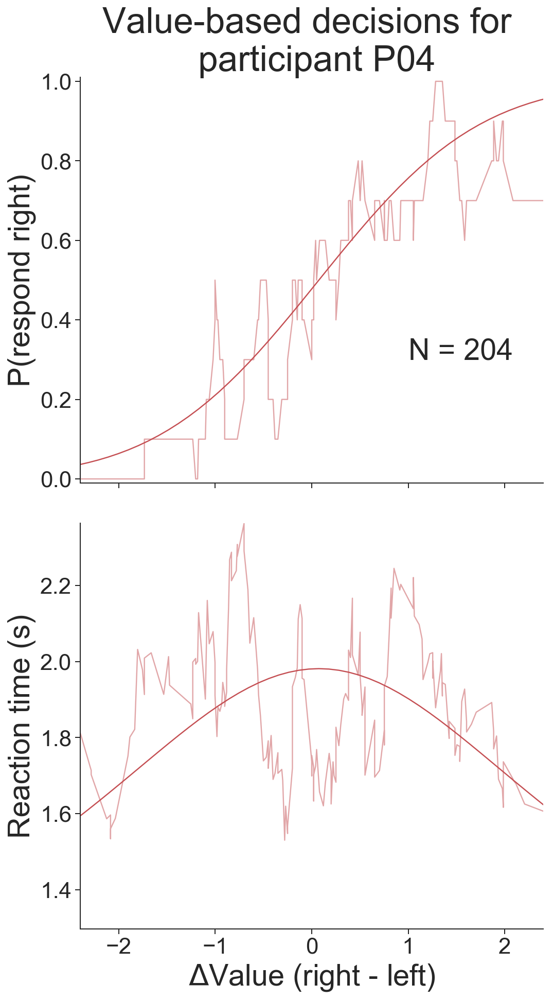

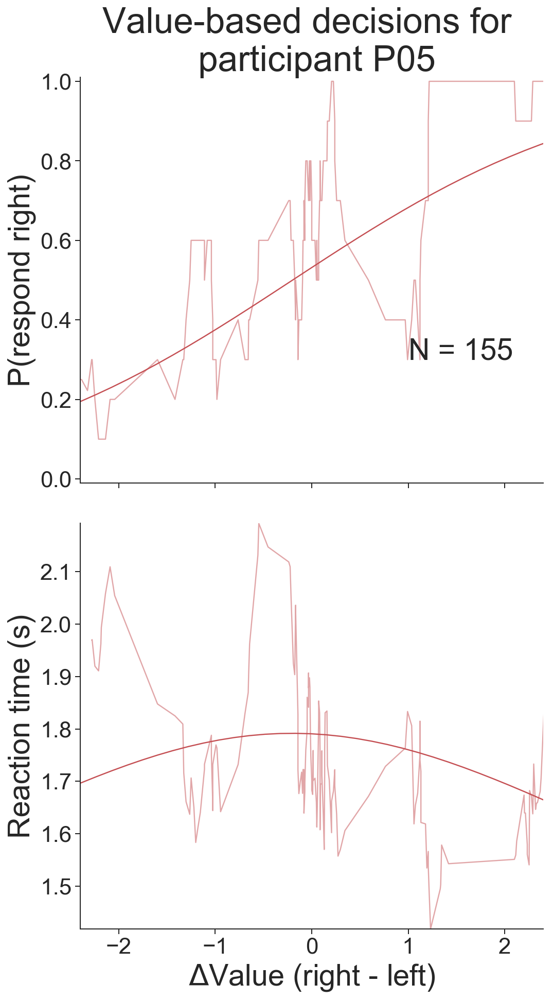

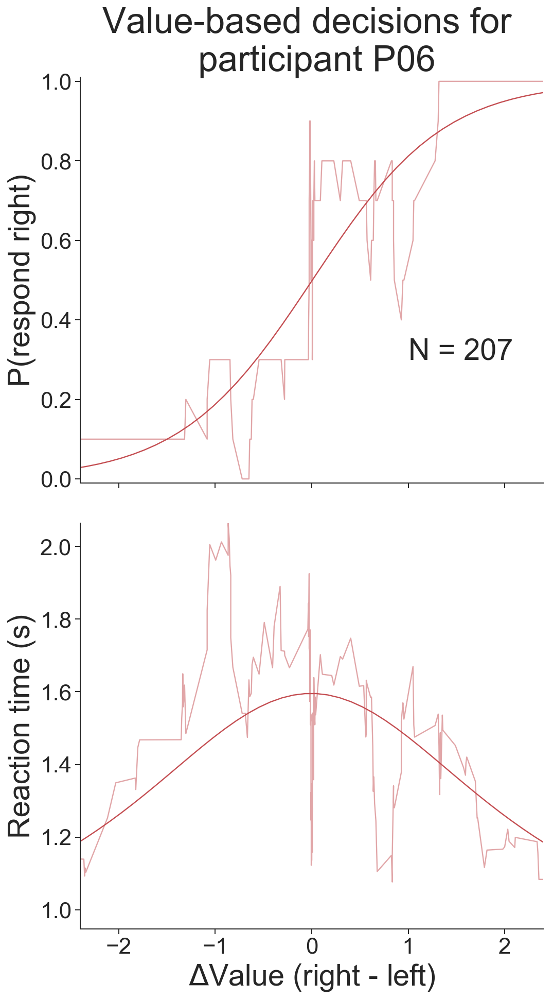

In [38]:
thetafoodHCallsub=pickle.load(open('thetafoodHCallsub.p','rb'))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
foodHC=pd.read_csv("foodHC.csv")
subnum=1

for s in foodHC.subjectID.unique():
    foodHCsub=foodHC[foodHC.subjectID==s]
    
    data1=np.column_stack([foodHCsub['deltavalrnd'],foodHCsub['RT'],foodHCsub['choseright'],foodHCsub['subjectID'],foodHCsub['deltaval']])

    theta1=thetafoodHCallsub[thetafoodHCallsub.subjid==s].values[0][:9]
    plotFoodDataWithFitsub(data1, theta1, plotcolor='b', subnum='O'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1
    
thetafoodMAallsub=pickle.load(open('thetafoodMAallsub.p','rb'))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
foodMA=pd.read_csv("foodMA.csv")
subnum=1

for s in foodMA.subjectID.unique():
    foodMAsub=foodMA[foodMA.subjectID==s]
    
    data1=np.column_stack([foodMAsub['deltavalrnd'],foodMAsub['RT'],foodMAsub['choseright'],foodMAsub['subjectID'],foodMAsub['deltaval']])

    theta1=thetafoodMAallsub[thetafoodMAallsub.subjid==s].values[0][:9]
    plotFoodDataWithFitsub(data1, theta1, plotcolor='r', subnum='P'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1

## Mixed-effects regression model to test three-way interaction

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Loading required package: emmeans

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: NOTE: As of emmeans versions > 1.2.3,
      The 'cld' function will be deprecated in favor of 'CLD'.
      You may use 'cld' only if you have package:multcomp attached.

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: ************
Welcome to afex. For support visit: http://afex.singmann.science/

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: - Functions for ANOVAs: aov_car(), aov_ez(), and aov_4()
- Methods for calculating p-values with mixed(): 'KR', 'S', 'LRT', and 'PB'
- 'afex_aov' and 'mixed' objects can be passed to emmeans() for follow

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: ci ~ gpc * taskc * diffc + (taskc * diffc | subjid)
   Data: df

     AIC      BIC   logLik deviance df.resid 
  7359.1   7485.2  -3661.5   7323.1     8161 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-30.0784  -0.5530   0.0550   0.6092  27.8010 

Random effects:
 Groups Name        Variance Std.Dev. Corr             
 subjid (Intercept) 0.04534  0.2129                    
        taskc       0.20152  0.4489   -0.45            
        diffc       0.38273  0.6187    0.14  0.64      
        taskc:diffc 0.98672  0.9933   -0.25 -0.46 -0.67
Number of obs: 8179, groups:  subjid, 20

Fixed effects:
                Estimate Std. Error z value Pr(>|z|)    
(Intercept)      0.22695    0.05616   4.041 5.32e-05 ***
gpc             -0.09559    0.12137  -0.788 0.430966    
taskc           -0.38935    0.11675  -3.335 0.000853 ***
diffc            

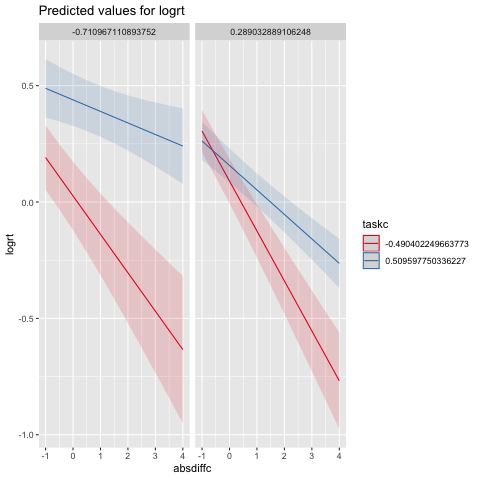

In [40]:
%%R
rm(list=ls())
library(afex)
foodHC=read.delim('foodHC.csv',sep=',')
dotsHC=read.delim('dotsHC.csv',sep=',')
foodHC$group="Healthy"
dotsHC$group="Healthy"
foodMA=read.delim('foodMA.csv',sep=',')
dotsMA=read.delim('dotsMA.csv',sep=',')
foodMA$group="Amnesia"
dotsMA$group="Amnesia"

dotsHC$task="Perceptual"
dotsMA$task="Perceptual"
foodHC$task="Value"
foodMA$task="Value"

dotsHC$choseblue=as.logical(dotsHC$choseblue)
dotsMA$choseblue=as.logical(dotsMA$choseblue)

foodHC$choseright=as.logical(foodHC$choseright)
foodHC$trial[foodHC$run==2]=foodHC$trial[foodHC$run==2]+70
foodHC$trial[foodHC$run==3]=foodHC$trial[foodHC$run==3]+140
foodMA$choseright=as.logical(foodMA$choseright)
foodMA$trial[foodMA$run==2]=foodMA$trial[foodMA$run==2]+70
foodMA$trial[foodMA$run==3]=foodMA$trial[foodMA$run==3]+140


df=data.frame(subjid=c(as.character(dotsHC$subjid),as.character(dotsMA$subjid),as.character(foodHC$subjectID),as.character(foodMA$subjectID)),
              group=c(dotsHC$group,dotsMA$group,foodHC$group,foodMA$group),
              task=c(dotsHC$task,dotsMA$task,foodHC$task,foodMA$task), 
              ci=c(as.numeric(dotsHC$choseblue),as.numeric(dotsMA$choseblue),as.numeric(foodHC$choseright),as.numeric(foodMA$choseright)),
              rt=c(dotsHC$RT,dotsMA$RT,foodHC$RT,foodMA$RT),
              diff=c(dotsHC$color_coh,dotsMA$color_coh,foodHC$deltaval,foodMA$deltaval),
              trial=c(dotsHC$runtrial,dotsMA$runtrial,foodHC$trial,foodMA$trial))

df$subjid=as.factor(df$subjid)
df$group=as.factor(df$group)
df$gp[df$group=='Healthy']=.5
df$gp[df$group=='Amnesia']=-.5
df$gpc=df$gp-mean(df$gp)
df$tsk[df$task=='Value']=.5
df$tsk[df$task=='Perceptual']=-.5
df$taskc=df$tsk-mean(df$tsk)

df$diffc=df$diff-mean(df$diff)
df$absdiffc=abs(df$diff)-mean(abs(df$diff))
df$trialc=df$trial-mean(df$trial)


modci=glmer(ci ~ gpc * taskc * diffc + (taskc * diffc|subjid), data=df, family='binomial')
print(summary(modci))
plot_model(modci,type='pred',terms=c('diffc','taskc','gpc'),show.ci=T)

df$logrt=log(df$rt)
modrt=lmer(logrt ~ gpc * taskc * absdiffc + trialc + (taskc * absdiffc|subjid), data=df)
print(summary(modrt))
plot_model(modrt,type='pred',terms=c('absdiffc','taskc','gpc'),show.ci=T)

# Heuristic model fits for HC and amnesic patients
## First start with a qualitative assessment of the model that posits that there should be no errors in choices of liked items on 'trivial' trials identified by lower cutoff on value kappa1 and upper cutoff on value kappa2

In [41]:
def extrema(data,theta):
    food=data.copy()
    xmin, xmax = theta
    meanval=np.mean([food['ratingLeft'],food['ratingRight']])
    food['lefthigh']=(food['ratingLeft']>xmax)
    food['righthigh']=(food['ratingRight']>xmax)
    food['leftlow']=(food['ratingLeft']<xmin)
    food['rightlow']=(food['ratingRight']<xmin)
    food['extrema']=(food['lefthigh']&~food['righthigh'])|(food['righthigh']&~food['lefthigh'])|(food['leftlow']&~food['rightlow'])|(food['rightlow']&~food['leftlow'])
    food['choserightnew']=food['choseright']
    food.loc[(food.extrema & food.righthigh)|(food.extrema & food.leftlow),'choserightnew']=1
    food.loc[(food.extrema & food.rightlow)|(food.extrema & food.lefthigh),'choserightnew']=0
    return food

## Figure 5—figure supplement 4B inset

In [42]:
foodHC=pd.read_csv('foodHC.csv')
number=30

maximums=np.linspace(0,10,number)
minimums=np.linspace(0,10,number)

propcorrHC=np.empty([number, number])*0
trialcountHC=np.empty([number, number])*0
scountHC=np.empty([number, number])*0

for s in foodHC.subjectID.unique():
    for c in range(number):
        for r in range(number):
            foodsubHC=foodHC[foodHC.subjectID==s].copy()
            foodsubHC=foodsubHC.reset_index()
            tmp=extrema(foodsubHC,[minimums[r],maximums[c]])
            tmp.loc[tmp.extrema,'conform']=tmp.loc[tmp.extrema,'choseright']==tmp.loc[tmp.extrema,'choserightnew']
        
            prop=tmp.loc[tmp.extrema,'conform'].mean()
            if ~np.isnan(prop):
                propcorrHC[r,c] += prop
                trialcountHC[r,c] += tmp.loc[tmp.extrema,'conform'].count()
                scountHC[r,c] += 1
            del(tmp)
propcorrHC=propcorrHC/scountHC
trialcountHC=trialcountHC/scountHC

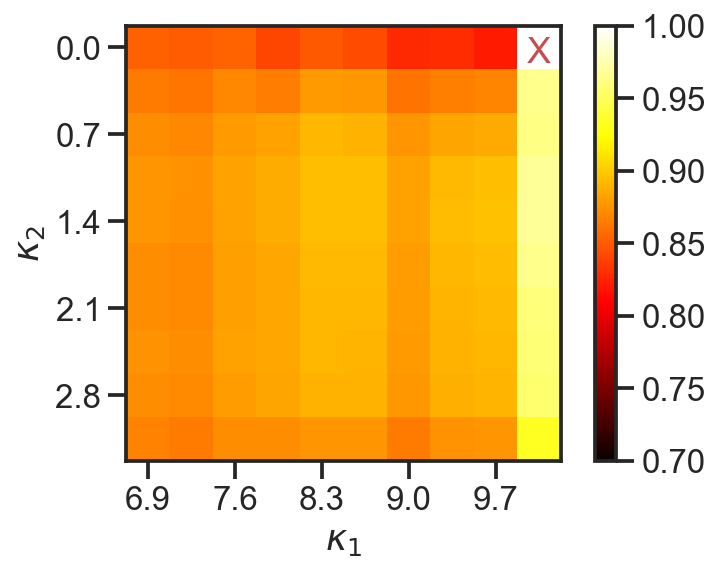

In [43]:
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('talk',font_scale=1)
plt.text(8.7,0.35,'X',color='r')
plt.imshow(propcorrHC[:10,20:], cmap='hot', interpolation='none',vmin=.7,vmax=1)
plt.xticks([0,2,4,6,8], [maximums.round(1)[20],maximums.round(1)[22],maximums.round(1)[24],maximums.round(1)[26],maximums.round(1)[28]])
plt.yticks([0,2,4,6,8], [maximums.round(1)[0],maximums.round(1)[2],maximums.round(1)[4],maximums.round(1)[6],maximums.round(1)[8]])
plt.ylabel(r'$\kappa_2$')
plt.xlabel(r'$\kappa_1$')
plt.colorbar()

## Figure 5—figure supplement 4C inset

In [44]:
foodMA=pd.read_csv('foodMA.csv')
number=30

maximums=np.linspace(0,10,number)
minimums=np.linspace(0,10,number)

propcorrMA=np.empty([number, number])*0
trialcountMA=np.empty([number, number])*0
scountMA=np.empty([number, number])*0

for s in foodMA.subjectID.unique():
    for c in range(number):
        for r in range(number):
            foodsubMA=foodMA[foodMA.subjectID==s].copy()
            foodsubMA=foodsubMA.reset_index()
            tmp=extrema(foodsubMA,[minimums[r],maximums[c]])
            tmp.loc[tmp.extrema,'conform']=tmp.loc[tmp.extrema,'choseright']==tmp.loc[tmp.extrema,'choserightnew']
        
            prop=tmp.loc[tmp.extrema,'conform'].mean()
            if ~np.isnan(prop):
                propcorrMA[r,c] += prop
                trialcountMA[r,c] += tmp.loc[tmp.extrema,'conform'].count()
                scountMA[r,c] += 1
            del(tmp)
propcorrMA=propcorrMA/scountMA
trialcountMA=trialcountMA/scountMA

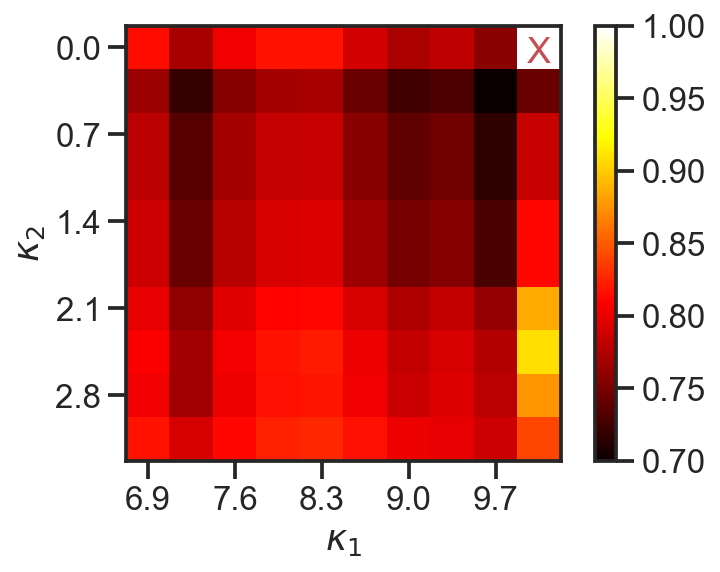

In [45]:
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('talk',font_scale=1)
plt.text(8.7,0.35,'X',color='r')
plt.imshow(propcorrMA[:10,20:], cmap='hot', interpolation='none',vmin=.7,vmax=1)
plt.xticks([0,2,4,6,8], [maximums.round(1)[20],maximums.round(1)[22],maximums.round(1)[24],maximums.round(1)[26],maximums.round(1)[28]])
plt.yticks([0,2,4,6,8], [maximums.round(1)[0],maximums.round(1)[2],maximums.round(1)[4],maximums.round(1)[6],maximums.round(1)[8]])
plt.ylabel(r'$\kappa_2$')
plt.xlabel(r'$\kappa_1$')
plt.colorbar()

In [46]:
import statsmodels
from statsmodels.genmod.generalized_linear_model import *

def heuristicnll(theta,data):

    xmin, xmax = theta
    food=extrema(data,theta)
    food['choseright']=food.choseright.astype('int')
    # log likelihood for choices
    logit1 = smf.logit('choseright ~ deltaval', data=food[~food.extrema])
    
    lm1 = logit1.fit(disp=False)
    lm1nll=-lm1.llf
    lm1nll=scipy.stats.binom.logpmf(food.loc[~food.extrema,'choseright'].sum(), food.loc[~food.extrema,'choseright'].count(), .5)
    #df1=pd.DataFrame({'deltaval':[max(food.deltaval)*3]})
    #pchose=lm1.predict(df1.deltaval)
    pchose=1-0.01
    
    ci=food.loc[food.extrema,'choseright'].values
    stim_strengthsex=food.loc[food.extrema,'deltaval'].values
    correct= (stim_strengthsex >= 0) * ci + ((stim_strengthsex < 0)) * np.logical_not(ci)
    tmp = np.repeat(pchose,len(ci)) * correct + np.repeat((1 - pchose),len(ci)) * np.logical_not(correct)
    lm2nll=np.sum(-np.log(tmp))
    
    rtfastnll=[]
    rtslownll=[]
    
    xs=np.linspace(0,3.2795,6560)
    rtex=food.loc[food.extrema,'RT'].values.tolist()
    dvalex=food.loc[food.extrema,'deltaval'].values.round(1).tolist()
    
    rtexsd=np.std(rtex)
    rtexmean=np.mean(rtex)
    pdfex  = norm.pdf(xs,rtexmean,rtexsd)
    probex = pdfex / pdfex.sum() # these are probabilities

    for i in range(len(rtex)):
        T = np.sum(~(xs >= rtex[i])) - 1
        # log likelihood of extrema RT data 
        rtfastnll = np.append(rtfastnll,-np.log(probex[T]))
        
        
    rtnoex=food.loc[~food.extrema,'RT'].values.tolist()
    dvalnoex=food.loc[~food.extrema,'deltaval'].values.round(1).tolist()
    rtnoexsd=np.std(rtnoex)
    rtnoexmean=np.mean(rtnoex)
    pdfnoex  = norm.pdf(xs,rtnoexmean,rtnoexsd)
    probnoex = pdfnoex / pdfnoex.sum() # these are probabilities

    for i in range(len(rtnoex)):
        T = np.sum(~(xs >= rtnoex[i])) - 1
        # log likelihood of non-extrema RT data 
        rtslownll = np.append(rtslownll,-np.log(probnoex[T]))
            
    
    nll=lm1nll+lm2nll+np.sum(rtfastnll)+np.sum(rtslownll)
    return(nll)

def fitheuristic2(data,theta_init=[2.5,7.5]):
    theta, nll = fminbnd(heuristicnll, theta_init, args=(data,),LB=[0,5], UB=[5,10])
    return nll, theta



## Fit heuristic model to HC

In [47]:
def do_fitheuristicsub(s):
    food=pd.read_csv('foodHC.csv')
    sid=food.subjectID.unique()[s]
    foodsub=food[food.subjectID==sid].copy()
    foodsub=foodsub.reset_index()

    nll=100000000
    x_init=np.linspace(0, 5, 100)
    scipy.random.shuffle(x_init)

    mu=np.linspace(5, 10, 100)
    scipy.random.shuffle(mu)


    for i in range(100):
        tmpnll, tmptheta=fitheuristic(foodsub,[x_init[i],mu[i]])
        if tmpnll<nll:
            nll=tmpnll
            theta=tmptheta
    file=pd.DataFrame({'xmin':theta[0],'xmax':theta[1],'nll':nll,'subjid':[sid]})
    out = np.append(theta,[nll,sid])
    return out
    
# run fits in parallel
foodHC=pd.read_csv('foodHC.csv')
inputs = range(len(foodHC['subjectID'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fitheuristicsub)(i) for i in inputs)

heuristicoutputHC=pd.DataFrame(results,columns=['xmin','xmax','nll','subjid'])
heuristicoutputHC['xmin']=heuristicoutputHC['xmin'].astype('float')
heuristicoutputHC['xmax']=heuristicoutputHC['xmax'].astype('float')
heuristicoutputHC['nll']=heuristicoutputHC['nll'].astype('float')

## Figure 5—figure supplement 4B

/Users/akram/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


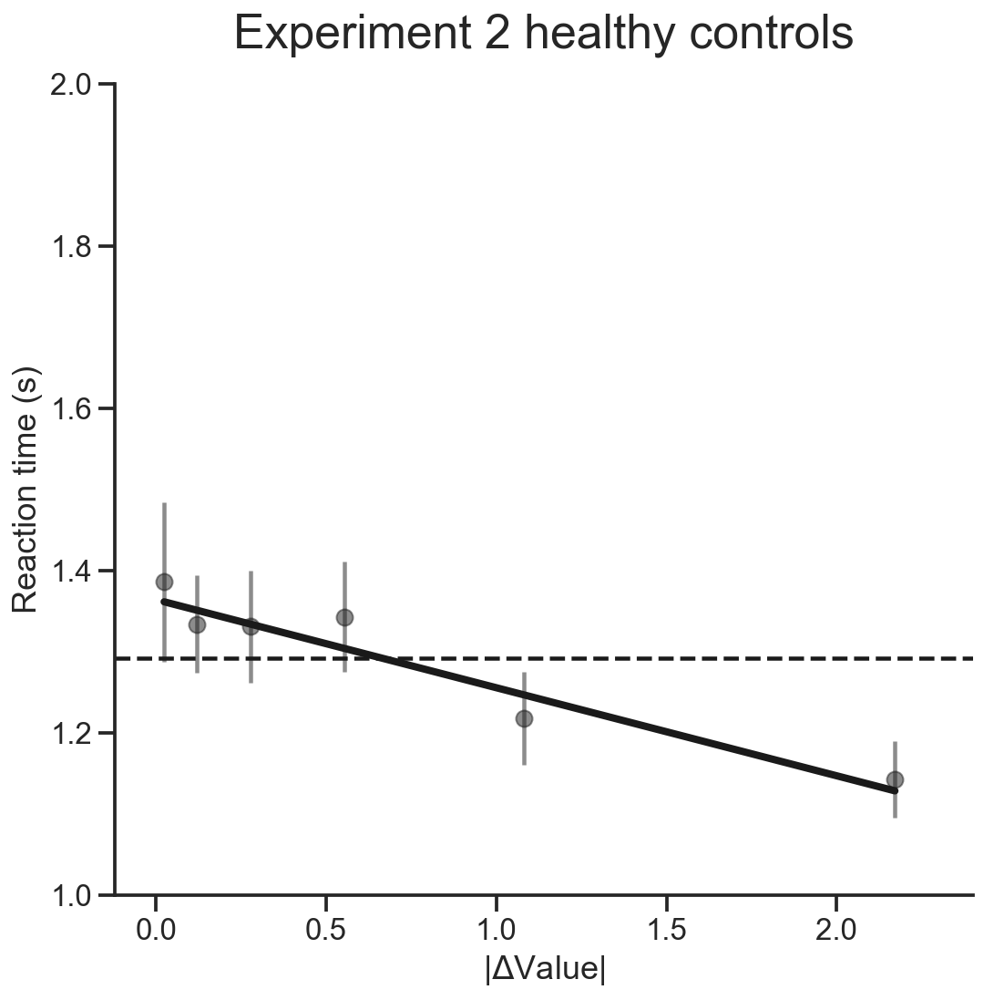

In [48]:
foodHC=pd.read_csv('foodHC.csv')

foodHC.loc[(foodHC.deltaval<=-1.5),'deltavalbin']=-2
foodHC.loc[(foodHC.deltaval<=-.75)&(foodHC.deltaval>-1.5),'deltavalbin']=-1
foodHC.loc[(foodHC.deltaval<=-.375)&(foodHC.deltaval>-.75),'deltavalbin']=-.5
foodHC.loc[(foodHC.deltaval<=-.1875)&(foodHC.deltaval>-.375),'deltavalbin']=-.25
foodHC.loc[(foodHC.deltaval<=-.0625)&(foodHC.deltaval>-.1875),'deltavalbin']=-.125
foodHC.loc[(foodHC.deltaval>-.0625)&(foodHC.deltaval<.0625),'deltavalbin']=0
foodHC.loc[(foodHC.deltaval>=.0625)&(foodHC.deltaval<.1875),'deltavalbin']=.125
foodHC.loc[(foodHC.deltaval>=.1875)&(foodHC.deltaval<.375),'deltavalbin']=.25
foodHC.loc[(foodHC.deltaval>=.375)&(foodHC.deltaval<.75),'deltavalbin']=.5
foodHC.loc[(foodHC.deltaval>=.75)&(foodHC.deltaval<1.5),'deltavalbin']=1
foodHC.loc[(foodHC.deltaval>=1.5),'deltavalbin']=2

foodHC['absdeltaval']=abs(foodHC.deltaval)
foodHC['deltavalbinabs']=abs(foodHC['deltavalbin'])
for b in foodHC.deltavalbinabs.unique():
    foodHC.loc[foodHC.deltavalbinabs==b,'deltavalbin']=foodHC.loc[foodHC.deltavalbinabs==b,'absdeltaval'].mean()

foodextremaHC=pd.DataFrame([],columns=foodHC.columns)

for s in heuristicoutputHC.subjid:    
    foodsubHC=foodHC[foodHC.subjectID==s].copy()
    tmpHC=heuristicoutputHC[heuristicoutputHC.subjid==s].copy()
    thetaHC=tmpHC.values[0][:2].astype('float')
    tmp2HC=extrema(foodsubHC,thetaHC)    
    foodextremaHC=foodextremaHC.append(tmp2HC,ignore_index=True)

foodextremaHC['extrema']=foodextremaHC.extrema.astype('bool')
foodextremaHC['choseright']=foodextremaHC.choseright.astype('float')
foodextremaHC['absdeltaval']=abs(foodextremaHC.deltaval)

foodHC=foodextremaHC.copy()

foodHC['absdeltavalbin']=abs(foodHC.deltavalbin)
colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    

fig, (ax_rt) = plt.subplots(1, 1, sharex=True, sharey=False, figsize=(8,8))
    
stim_strengths1=abs(foodHC['deltavalbin'])
rt1=foodHC['RT']
ci1=foodHC['choseright']
subj1 = foodHC['subjectID']


stim_strengths_to_propagate1 = np.linspace(np.min(np.unique(stim_strengths1)), np.max(np.unique(stim_strengths1)), 51)

xdata = np.linspace(np.min(np.unique(stim_strengths1)), np.max(np.unique(stim_strengths1)), 51)


df2=pd.DataFrame({'subjid':foodHC.loc[foodHC.extrema,'subjectID'].copy(),'stim_strength':abs(foodHC.loc[foodHC.extrema,'deltavalbin'].copy()),
                  'ci':foodHC.loc[foodHC.extrema,'Outcome'].astype('bool').copy(),'rt':foodHC.loc[foodHC.extrema,'RT']})
df1=pd.DataFrame({'subjid':foodHC.loc[~foodHC.extrema,'subjectID'].copy(),'stim_strength':abs(foodHC.loc[~foodHC.extrema,'deltavalbin'].copy()),
                  'ci':foodHC.loc[~foodHC.extrema,'Outcome'].astype('bool').copy(),'rt':foodHC.loc[~foodHC.extrema,'RT']})


#means per participant per stim_strenght
bothmeans1=df1.groupby(['subjid','stim_strength'],as_index=False).mean()
bothmeans2=df2.groupby(['subjid','stim_strength'],as_index=False).mean()

    
ustim_strengths1=df1.groupby(['stim_strength'],as_index=False).mean()['stim_strength']
ustim_strengths2=df2.groupby(['stim_strength'],as_index=False).mean()['stim_strength']
meanrt_both1=bothmeans1.groupby(['stim_strength'],as_index=False).mean()['rt']
meanrt_both2=bothmeans2.groupby(['stim_strength'],as_index=False).mean()['rt']
    
semrt_both1=bothmeans1.groupby(['stim_strength'],as_index=False).sem()['rt']
semrt_both2=bothmeans2.groupby(['stim_strength'],as_index=False).sem()['rt']
if len(df1['subjid'].unique())==1:
    try:
        semrt_both1=df1.groupby(['stim_strength'],as_index=False).sem()['rt']
    except:
        semrt_both1 = np.repeat(0,len(df1.stim_strength.unique()))


if len(df2['subjid'].unique())==1:
    try:
        semrt_both2=df2.groupby(['stim_strength'],as_index=False).sem()['rt']
    except:
        semrt_both2 = np.repeat(0,len(df2.stim_strength.unique()))

        
RTnoex=meanrt_both1.mean()
RTex=foodHC.loc[foodHC.extrema,'RT'].mean()

foodnoex=foodHC[~foodHC.extrema]

modrt=smf.mixedlm('RT ~ absdeltaval', groups=foodnoex.subjectID, data=foodnoex)
modrtfit=modrt.fit()
predrt = modrtfit.predict(pd.DataFrame({'absdeltaval':xdata}))
    

ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,color='k', linestyle='None', marker='o', capsize=0,alpha=.5)
    
ax_rt.add_line(plt.Line2D([-0.1 * 1.2, 2 * 1.2], [RTnoex,RTnoex], linestyle='--', color='k'))
    
foodsub=foodnoex.groupby(['subjectID','deltavalbin'],as_index=False).mean()
rp = sns.regression._RegressionPlotter(foodsub.deltavalbin,foodsub.RT)
grid, yhat, err_bands = rp.fit_regression(x_range=(-0.1 * 1.2, 2 * 1.2))

ax_rt.add_line(plt.Line2D(xdata, predrt, color='k', linewidth=4))

ax_rt.set_xlabel(r'|$\Delta$'+'Value|')
ax_rt.set_ylabel('Reaction time (s)')

ax_rt.set_xlim((-.1 * 1.2, 2 * 1.2))

ax_rt.set_ylim((1,2))
sns.despine(offset=0, trim=False)
ax_rt.set_title('Experiment 2 healthy controls',fontsize='x-large',pad=20)
plt.tight_layout()
plt.show()

## Fit heuristic model to Amnesic patients

In [49]:
def do_fitheuristicsub(s):
    food=pd.read_csv('foodMA.csv')
    sid=food.subjectID.unique()[s]
    foodsub=food[food.subjectID==sid].copy()
    foodsub=foodsub.reset_index()

    nll=100000000
    x_init=np.linspace(0, 5, 100)
    scipy.random.shuffle(x_init)

    mu=np.linspace(5, 10, 100)
    scipy.random.shuffle(mu)


    for i in range(100):
        tmpnll, tmptheta=fitheuristic(foodsub,[x_init[i],mu[i]])
        if tmpnll<nll:
            nll=tmpnll
            theta=tmptheta
    file=pd.DataFrame({'xmin':theta[0],'xmax':theta[1],'nll':nll,'subjid':[sid]})
    out = np.append(theta,[nll,sid])
    return out
    
# run fits in parallel
foodMA=pd.read_csv('foodMA.csv')
inputs = range(len(foodMA['subjectID'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fitheuristicsub)(i) for i in inputs)

heuristicoutputMA=pd.DataFrame(results,columns=['xmin','xmax','nll','subjid'])
heuristicoutputMA['xmin']=heuristicoutputMA['xmin'].astype('float')
heuristicoutputMA['xmax']=heuristicoutputMA['xmax'].astype('float')
heuristicoutputMA['nll']=heuristicoutputMA['nll'].astype('float')

## Figure 5—figure supplement 4C

/Users/akram/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


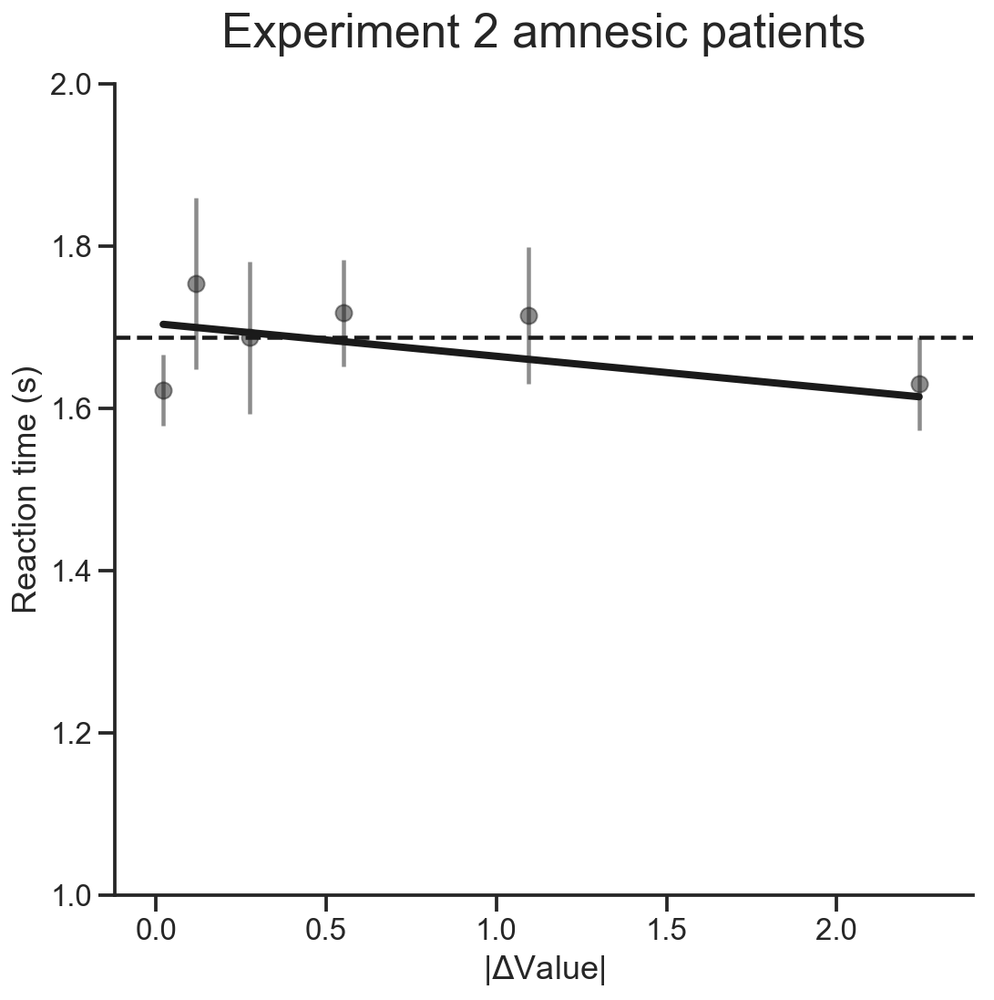

In [50]:
foodMA=pd.read_csv('foodMA.csv')

foodMA.loc[(foodMA.deltaval<=-1.5),'deltavalbin']=-2
foodMA.loc[(foodMA.deltaval<=-.75)&(foodMA.deltaval>-1.5),'deltavalbin']=-1
foodMA.loc[(foodMA.deltaval<=-.375)&(foodMA.deltaval>-.75),'deltavalbin']=-.5
foodMA.loc[(foodMA.deltaval<=-.1875)&(foodMA.deltaval>-.375),'deltavalbin']=-.25
foodMA.loc[(foodMA.deltaval<=-.0625)&(foodMA.deltaval>-.1875),'deltavalbin']=-.125
foodMA.loc[(foodMA.deltaval>-.0625)&(foodMA.deltaval<.0625),'deltavalbin']=0
foodMA.loc[(foodMA.deltaval>=.0625)&(foodMA.deltaval<.1875),'deltavalbin']=.125
foodMA.loc[(foodMA.deltaval>=.1875)&(foodMA.deltaval<.375),'deltavalbin']=.25
foodMA.loc[(foodMA.deltaval>=.375)&(foodMA.deltaval<.75),'deltavalbin']=.5
foodMA.loc[(foodMA.deltaval>=.75)&(foodMA.deltaval<1.5),'deltavalbin']=1
foodMA.loc[(foodMA.deltaval>=1.5),'deltavalbin']=2

foodMA['absdeltaval']=abs(foodMA.deltaval)
foodMA['deltavalbinabs']=abs(foodMA['deltavalbin'])
for b in foodMA.deltavalbinabs.unique():
    foodMA.loc[foodMA.deltavalbinabs==b,'deltavalbin']=foodMA.loc[foodMA.deltavalbinabs==b,'absdeltaval'].mean()

foodextremaMA=pd.DataFrame([],columns=foodMA.columns)

for s in heuristicoutputMA.subjid:    
    foodsubMA=foodMA[foodMA.subjectID==s].copy()
    tmpMA=heuristicoutputMA[heuristicoutputMA.subjid==s].copy()
    thetaMA=tmpMA.values[0][:2].astype('float')
    tmp2MA=extrema(foodsubMA,thetaMA)    
    foodextremaMA=foodextremaMA.append(tmp2MA,ignore_index=True)

foodextremaMA['extrema']=foodextremaMA.extrema.astype('bool')
foodextremaMA['choseright']=foodextremaMA.choseright.astype('float')
foodextremaMA['absdeltaval']=abs(foodextremaMA.deltaval)

foodMA=foodextremaMA.copy()

foodMA['absdeltavalbin']=abs(foodMA.deltavalbin)
colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    

fig, (ax_rt) = plt.subplots(1, 1, sharex=True, sharey=False, figsize=(8,8))
    
stim_strengths1=abs(foodMA['deltavalbin'])
rt1=foodMA['RT']
ci1=foodMA['choseright']
subj1 = foodMA['subjectID']


stim_strengths_to_propagate1 = np.linspace(np.min(np.unique(stim_strengths1)), np.max(np.unique(stim_strengths1)), 51)

xdata = np.linspace(np.min(np.unique(stim_strengths1)), np.max(np.unique(stim_strengths1)), 51)


df2=pd.DataFrame({'subjid':foodMA.loc[foodMA.extrema,'subjectID'].copy(),'stim_strength':abs(foodMA.loc[foodMA.extrema,'deltavalbin'].copy()),
                  'ci':foodMA.loc[foodMA.extrema,'Outcome'].astype('bool').copy(),'rt':foodMA.loc[foodMA.extrema,'RT']})
df1=pd.DataFrame({'subjid':foodMA.loc[~foodMA.extrema,'subjectID'].copy(),'stim_strength':abs(foodMA.loc[~foodMA.extrema,'deltavalbin'].copy()),
                  'ci':foodMA.loc[~foodMA.extrema,'Outcome'].astype('bool').copy(),'rt':foodMA.loc[~foodMA.extrema,'RT']})


#means per participant per stim_strenght
bothmeans1=df1.groupby(['subjid','stim_strength'],as_index=False).mean()
bothmeans2=df2.groupby(['subjid','stim_strength'],as_index=False).mean()

    
ustim_strengths1=df1.groupby(['stim_strength'],as_index=False).mean()['stim_strength']
ustim_strengths2=df2.groupby(['stim_strength'],as_index=False).mean()['stim_strength']
meanrt_both1=bothmeans1.groupby(['stim_strength'],as_index=False).mean()['rt']
meanrt_both2=bothmeans2.groupby(['stim_strength'],as_index=False).mean()['rt']
    
semrt_both1=bothmeans1.groupby(['stim_strength'],as_index=False).sem()['rt']
semrt_both2=bothmeans2.groupby(['stim_strength'],as_index=False).sem()['rt']
if len(df1['subjid'].unique())==1:
    try:
        semrt_both1=df1.groupby(['stim_strength'],as_index=False).sem()['rt']
    except:
        semrt_both1 = np.repeat(0,len(df1.stim_strength.unique()))


if len(df2['subjid'].unique())==1:
    try:
        semrt_both2=df2.groupby(['stim_strength'],as_index=False).sem()['rt']
    except:
        semrt_both2 = np.repeat(0,len(df2.stim_strength.unique()))

        
RTnoex=meanrt_both1.mean()
RTex=foodMA.loc[foodMA.extrema,'RT'].mean()

foodnoex=foodMA[~foodMA.extrema]

modrt=smf.mixedlm('RT ~ absdeltaval', groups=foodnoex.subjectID, data=foodnoex)
modrtfit=modrt.fit()
predrt = modrtfit.predict(pd.DataFrame({'absdeltaval':xdata}))
    

ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,color='k', linestyle='None', marker='o', capsize=0,alpha=.5)
    
ax_rt.add_line(plt.Line2D([-0.1 * 1.2, 2 * 1.2], [RTnoex,RTnoex], linestyle='--', color='k'))
    
foodsub=foodnoex.groupby(['subjectID','deltavalbin'],as_index=False).mean()

ax_rt.add_line(plt.Line2D(xdata, predrt, color='k',linewidth=4))

ax_rt.set_xlabel(r'|$\Delta$'+'Value|')
ax_rt.set_ylabel('Reaction time (s)')

ax_rt.set_xlim((-.1 * 1.2, 2 * 1.2))
ax_rt.set_ylim((1,2))
sns.despine(offset=0, trim=False)
ax_rt.set_title('Experiment 2 amnesic patients',fontsize='x-large',pad=20)
plt.tight_layout()
plt.show()

## Model comparisons for HC

In [54]:
food=pd.read_csv('foodHC.csv')
food['deltavalrnd']=food.deltaval.round(1)

[theta,fopt]=pickle.load(open('thetafoodHCcombined.p','rb'),encoding='latin1')
eps = 2 ** -52

# a few global variables that speed up optimization
T = None
It = None
STIM_STRENGTH = None
Ic = None

k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    
stim_strengths = food.deltavalrnd.values
u_stim_strengths = np.unique(stim_strengths)
rt=food.RT.values
dt=0.0005

# propagate expects drift to be 2d so that it can tile properly
drifts, t, Bup, Blo, y, yinit = discretize(theta, u_stim_strengths, np.max(rt), dt)

# propagate density
D = propagate(drifts, t, Bup, Blo, y, yinit)

# convolve distribution of exit times with Gaussian distribution of tnd
r = norm.pdf(t, tnd, tnd_sd) * dt

xs=np.linspace(min(D['t'].flatten()),max(D['t'].flatten())*2,len(D['t'].flatten())*2-1)

foodextrema=extrema(food,[0,3])

foodex=pd.DataFrame([],columns=foodextrema.columns)

for s in food.subjectID.unique():
    tmp=heuristicoutputHC[heuristicoutputHC.subjid==s].copy()
    theta=tmp.values[0][:2].astype('float')
    foodsub=food[food.subjectID==s].copy()
    foodsub=foodsub.reset_index()
    foodextrema=extrema(foodsub,theta)
    foodex=foodex.append(foodextrema,ignore_index=True)

del(foodextrema)
del(food)

foodex['choseright']=foodex.choseright.astype('int')
foodex['extrema']=foodex.extrema.astype('bool')

# log likelihood for choices
logit1 = smf.logit('choseright ~ deltaval', data=foodex[~foodex.extrema])
    
lm1 = logit1.fit(disp=False)
lm1nll1 = -lm1.llf

# p(error) is assessed as logistic prediction at max(abs(deltavalue)), not at 0.01, which is what was used during fitting
df1=pd.DataFrame({'deltaval':[max(abs(foodex.deltaval))]})
pchose=lm1.predict(df1.deltaval)
    
ci=foodex.loc[foodex.extrema,'choseright'].values
stim_strengthsex=foodex.loc[foodex.extrema,'deltaval'].values
correct= (stim_strengthsex >= 0) * ci + ((stim_strengthsex < 0)) * np.logical_not(ci)
tmp = np.repeat(pchose,len(ci)) * correct + np.repeat((1 - pchose),len(ci)) * np.logical_not(correct)
lm2nll1=np.sum(-np.log(tmp))
    
rtex=foodex.loc[foodex.extrema,'RT'].values.tolist()

pdfex  = norm.pdf(xs,foodex.loc[foodex.extrema,'RT'].mean(),foodex.loc[foodex.extrema,'RT'].std())
probex = pdfex / pdfex.sum() # these are probabilities
t=0
rtfastnll1=0
for i in range(len(rtex)):
    T = np.sum(~(xs >= rtex[i])) - 1
    # log likelihood of extrema RT data 
    rtfastnll1 += -np.log(probex[T])
    t+=1
        
rtnoex=foodex.loc[~foodex.extrema,'RT'].values.tolist()
pdfnoex  = norm.pdf(xs,foodex.loc[~foodex.extrema,'RT'].mean(),foodex.loc[~foodex.extrema,'RT'].std())
probnoex = pdfnoex / pdfnoex.sum() # these are probabilities

rtslownll1=0
for i in range(len(rtnoex)):
    T = np.sum(~(xs >= rtnoex[i])) - 1
    # log likelihood of non-extrema RT data 
    rtslownll1 += -np.log(probnoex[T])
    t+=1

nllheuristic1 = lm1nll1+lm2nll1+rtfastnll1+rtslownll1

print('Experiment 1 Heuristic NLL TOTAL = '+ str(nllheuristic1))
print('Experiment 1 DDM NLL TOTAL = '+ str(fopt))
print('Experiment 1 BIC = '+ str(nllheuristic1-fopt))

/Users/akram/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


Experiment 1 Heuristic NLL TOTAL = 24880.1911236
Experiment 1 DDM NLL TOTAL = 24342.6864651
Experiment 1 BIC = 537.504658423


## Model comparisons for Amnesics

In [55]:
food=pd.read_csv('foodMA.csv')
food['deltavalrnd']=food.deltaval.round(1)

[theta,fopt]=pickle.load(open('thetafoodMAcombined.p','rb'),encoding='latin1')
eps = 2 ** -52

# a few global variables that speed up optimization
T = None
It = None
STIM_STRENGTH = None
Ic = None

k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    
stim_strengths = food.deltavalrnd.values
u_stim_strengths = np.unique(stim_strengths)
rt=food.RT.values
dt=0.0005

# propagate expects drift to be 2d so that it can tile properly
drifts, t, Bup, Blo, y, yinit = discretize(theta, u_stim_strengths, np.max(rt), dt)

# propagate density
D = propagate(drifts, t, Bup, Blo, y, yinit)

# convolve distribution of exit times with Gaussian distribution of tnd
r = norm.pdf(t, tnd, tnd_sd) * dt

xs=np.linspace(min(D['t'].flatten()),max(D['t'].flatten())*2,len(D['t'].flatten())*2-1)

foodextrema=extrema(food,[0,3])

foodex=pd.DataFrame([],columns=foodextrema.columns)

for s in food.subjectID.unique():
    tmp=heuristicoutputMA[heuristicoutputMA.subjid==s].copy()
    theta=tmp.values[0][:2].astype('float')
    foodsub=food[food.subjectID==s].copy()
    foodsub=foodsub.reset_index()
    foodextrema=extrema(foodsub,theta)
    foodex=foodex.append(foodextrema,ignore_index=True)

del(foodextrema)
del(food)

foodex['choseright']=foodex.choseright.astype('int')
foodex['extrema']=foodex.extrema.astype('bool')

# log likelihood for choices
logit1 = smf.logit('choseright ~ deltaval', data=foodex[~foodex.extrema])
    
lm1 = logit1.fit(disp=False)
lm1nll1 = -lm1.llf

# p(error) is assessed as logistic prediction at max(abs(deltavalue)), not at 0.01, which is what was used during fitting
df1=pd.DataFrame({'deltaval':[max(abs(foodex.deltaval))]})
pchose=lm1.predict(df1.deltaval)
    
ci=foodex.loc[foodex.extrema,'choseright'].values
stim_strengthsex=foodex.loc[foodex.extrema,'deltaval'].values
correct= (stim_strengthsex >= 0) * ci + ((stim_strengthsex < 0)) * np.logical_not(ci)
tmp = np.repeat(pchose,len(ci)) * correct + np.repeat((1 - pchose),len(ci)) * np.logical_not(correct)
lm2nll1=np.sum(-np.log(tmp))
    
rtex=foodex.loc[foodex.extrema,'RT'].values.tolist()

pdfex  = norm.pdf(xs,foodex.loc[foodex.extrema,'RT'].mean(),foodex.loc[foodex.extrema,'RT'].std())
probex = pdfex / pdfex.sum() # these are probabilities
t=0
rtfastnll1=0
for i in range(len(rtex)):
    T = np.sum(~(xs >= rtex[i])) - 1
    # log likelihood of extrema RT data 
    rtfastnll1 += -np.log(probex[T])
    t+=1
        
rtnoex=foodex.loc[~foodex.extrema,'RT'].values.tolist()
pdfnoex  = norm.pdf(xs,foodex.loc[~foodex.extrema,'RT'].mean(),foodex.loc[~foodex.extrema,'RT'].std())
probnoex = pdfnoex / pdfnoex.sum() # these are probabilities

rtslownll1=0
for i in range(len(rtnoex)):
    T = np.sum(~(xs >= rtnoex[i])) - 1
    # log likelihood of non-extrema RT data 
    rtslownll1 += -np.log(probnoex[T])
    t+=1

nllheuristic1 = lm1nll1+lm2nll1+rtfastnll1+rtslownll1

print('Experiment 1 Heuristic NLL TOTAL = '+ str(nllheuristic1))
print('Experiment 1 DDM NLL TOTAL = '+ str(fopt))
print('Experiment 1 BIC = '+ str(nllheuristic1-fopt))

Experiment 1 Heuristic NLL TOTAL = 10014.6526218
Experiment 1 DDM NLL TOTAL = 9937.47216359
Experiment 1 BIC = 77.1804581735


/Users/akram/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


# SIMULATE DATA

In [10]:
def simulateDotsDataHC(k=12.5, B0=0.6, Bdel=0.3, B2=0.3,
                 tnd=0.4, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1,dt=0.0005):
    """
    Simulate choices and reaction times for a diffusion to bound model
    with exponentially and symmetrically decreasing bounds
    Parameters
    ----------
    k : float, proportionality constant between stim_strength and drift rate
    B0 : float, initial bound height
    Bdelay : float, delay in seconds before bound starts decreasing
    B2 : float, coefficient of quadratic term that governs bound decrease
    tnd: float, non decision time
    tnd_sd: float, standard deviation of non-decision time
    y0 : float, initial offset of decision variable (relative to 0)
    stim_strength_bias : float, bias in drift rate (added to stim_strength before k mult)
    n_trials : int, number of trials per stim_strength to simulate
    dt : temporal resolution of the simulated diffusion process
    Returns
    -------
    out : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice
    """
    dots=pd.read_csv('dotsHC.csv')
    stim_strengths = np.array(sorted(dots.color_coh.unique())).astype('complex') ** plaw
    #stim_strengths = food.deltavalrnd.unique()
    
    max_t = 3 # guarantees that all paths cross bound
    n_t = int(max_t / dt)
    t = np.arange(0, max_t, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel
    # exponential decay
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup
    
    #out = np.zeros([len(stim_strengths) * n_trials, 3])
    out = np.zeros([len(dots.index), 3])
    counter = 0
    for i, stim_strength in enumerate(stim_strengths):
        print('Simulating strength {:.3f}'.format(stim_strength))
        n_trials=len(dots.loc[dots.color_coh==sorted(dots.color_coh.unique())[i],'RT'])
        drift = k * (stim_strength + stim_strength_bias)
        drift = np.ones([n_trials, n_t]) * t * drift
        noise = np.cumsum(np.random.randn(n_trials, n_t) * np.sqrt(dt), axis=1)
        paths = drift + noise
        bound_cross = np.logical_or(paths >= Bup, paths <= Blo)
        try:
            idx = np.apply_along_axis(lambda x: np.where(x)[0][0], 1, bound_cross)
        except:
            pass

        choice = np.sign(paths[np.arange(n_trials), idx])
        choice[choice < 0] = 0
        t_decision = t[idx]
        t_rt = t_decision + tnd + np.random.randn(n_trials) * tnd_sd

        out[counter:counter + n_trials, 0] = np.repeat(stim_strength, n_trials)
        out[counter:counter + n_trials, 1] = t_rt
        out[counter:counter + n_trials, 2] = choice
        counter += n_trials

    return out

In [12]:
[theta,fopt]=pickle.load(open('thetadotsHCcombined.p','rb'),encoding='latin1')
simdata=simulateDotsDataHC(k=theta[0], B0=theta[1], Bdel=theta[2], B2=theta[3],tnd=theta[4], tnd_sd=theta[5], stim_strength_bias=theta[6], y0=theta[7], plaw=theta[8], dt=0.0005)
dots=pd.read_csv('dotsHC.csv')
tmp=sorted(dots.color_coh.unique())
i2=0
for i in range(0,len(np.unique(simdata[:,0]))):
    simdata[simdata[:,0]==simdata[i2,0],0]=tmp[i]
    i2=i2+np.sum(simdata[:,0]==tmp[i])
pickle.dump(simdata, open('simulateddotsdataHC.p','wb'))

Simulating strength -1.455+0.981j
Simulating strength -0.829+0.559j
Simulating strength -0.473+0.319j
Simulating strength -0.269+0.182j


/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:59: ComplexWarning: Casting complex values to real discards the imaginary part
/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:61: ComplexWarning: Casting complex values to real discards the imaginary part


Simulating strength -0.153+0.103j
Simulating strength 0.000+0.000j
Simulating strength 0.185+0.000j
Simulating strength 0.325+0.000j
Simulating strength 0.570+0.000j
Simulating strength 1.000+0.000j
Simulating strength 1.755+0.000j


In [13]:
def simulateDotsDataMA(k=12.5, B0=0.6, Bdel=0.3, B2=0.3,
                 tnd=0.4, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1,dt=0.0005):
    """
    Simulate choices and reaction times for a diffusion to bound model
    with exponentially and symmetrically decreasing bounds
    Parameters
    ----------
    k : float, proportionality constant between stim_strength and drift rate
    B0 : float, initial bound height
    Bdelay : float, delay in seconds before bound starts decreasing
    B2 : float, coefficient of quadratic term that governs bound decrease
    tnd: float, non decision time
    tnd_sd: float, standard deviation of non-decision time
    y0 : float, initial offset of decision variable (relative to 0)
    stim_strength_bias : float, bias in drift rate (added to stim_strength before k mult)
    n_trials : int, number of trials per stim_strength to simulate
    dt : temporal resolution of the simulated diffusion process
    Returns
    -------
    out : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice
    """
    dots=pd.read_csv('dotsMA.csv')
    stim_strengths = np.array(sorted(dots.color_coh.unique())).astype('complex') ** plaw
    #stim_strengths = food.deltavalrnd.unique()
    
    max_t = 3 # guarantees that all paths cross bound
    n_t = int(max_t / dt)
    t = np.arange(0, max_t, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel
    # exponential decay
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup
    
    #out = np.zeros([len(stim_strengths) * n_trials, 3])
    out = np.zeros([len(dots.index), 3])
    counter = 0
    for i, stim_strength in enumerate(stim_strengths):
        print('Simulating strength {:.3f}'.format(stim_strength))
        n_trials=len(dots.loc[dots.color_coh==sorted(dots.color_coh.unique())[i],'RT'])
        drift = k * (stim_strength + stim_strength_bias)
        drift = np.ones([n_trials, n_t]) * t * drift
        noise = np.cumsum(np.random.randn(n_trials, n_t) * np.sqrt(dt), axis=1)
        paths = drift + noise
        bound_cross = np.logical_or(paths >= Bup, paths <= Blo)
        try:
            idx = np.apply_along_axis(lambda x: np.where(x)[0][0], 1, bound_cross)
        except:
            pass

        choice = np.sign(paths[np.arange(n_trials), idx])
        choice[choice < 0] = 0
        t_decision = t[idx]
        t_rt = t_decision + tnd + np.random.randn(n_trials) * tnd_sd

        out[counter:counter + n_trials, 0] = np.repeat(stim_strength, n_trials)
        out[counter:counter + n_trials, 1] = t_rt
        out[counter:counter + n_trials, 2] = choice
        counter += n_trials

    return out

In [15]:
[theta,fopt]=pickle.load(open('thetadotsMAcombined.p','rb'),encoding='latin1')
simdata=simulateDotsDataHC(k=theta[0], B0=theta[1], Bdel=theta[2], B2=theta[3],tnd=theta[4], tnd_sd=theta[5], stim_strength_bias=theta[6], y0=theta[7], plaw=theta[8], dt=0.0005)
dots=pd.read_csv('dotsMA.csv')
tmp=sorted(dots.color_coh.unique())
i2=0
for i in range(0,len(np.unique(simdata[:,0]))):
    simdata[simdata[:,0]==simdata[i2,0],0]=tmp[i]
    i2=i2+np.sum(simdata[:,0]==tmp[i])
pickle.dump(simdata, open('simulateddotsdataMA.p','wb'))

Simulating strength -1.514+0.922j
Simulating strength -0.854+0.520j
Simulating strength -0.482+0.293j
Simulating strength -0.272+0.165j


/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:59: ComplexWarning: Casting complex values to real discards the imaginary part
/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:61: ComplexWarning: Casting complex values to real discards the imaginary part


Simulating strength -0.153+0.093j
Simulating strength 0.000+0.000j
Simulating strength 0.180+0.000j
Simulating strength 0.318+0.000j
Simulating strength 0.564+0.000j
Simulating strength 1.000+0.000j
Simulating strength 1.773+0.000j


In [17]:
def simulateFoodDataHC(k=12.5, B0=0.6, Bdel=0.3, B2=0.3,
                 tnd=0.4, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1,dt=0.0005):
    """
    Simulate choices and reaction times for a diffusion to bound model
    with exponentially and symmetrically decreasing bounds
    Parameters
    ----------
    k : float, proportionality constant between stim_strength and drift rate
    B0 : float, initial bound height
    Bdelay : float, delay in seconds before bound starts decreasing
    B2 : float, coefficient of quadratic term that governs bound decrease
    tnd: float, non decision time
    tnd_sd: float, standard deviation of non-decision time
    y0 : float, initial offset of decision variable (relative to 0)
    stim_strength_bias : float, bias in drift rate (added to stim_strength before k mult)
    n_trials : int, number of trials per stim_strength to simulate
    dt : temporal resolution of the simulated diffusion process
    Returns
    -------
    out : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice
    """
    food=pd.read_csv('foodHC.csv')
    food['deltavalrnd']=np.round(food.deltaval,1)
    stim_strengths = np.array(sorted(food.deltavalrnd.unique())).astype('complex') ** plaw
    #stim_strengths = food.deltavalrnd.unique()
    
    max_t = 3 # guarantees that all paths cross bound
    n_t = int(max_t / dt)
    t = np.arange(0, max_t, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel
    # exponential decay
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup
    
    #out = np.zeros([len(stim_strengths) * n_trials, 3])
    out = np.zeros([len(food.index), 3])
    counter = 0
    for i, stim_strength in enumerate(stim_strengths):
        print('Simulating strength {:.3f}'.format(stim_strength))
        n_trials=len(food.loc[food.deltavalrnd==sorted(food.deltavalrnd.unique())[i],'RT'])
        drift = k * (stim_strength + stim_strength_bias)
        drift = np.ones([n_trials, n_t]) * t * drift
        noise = np.cumsum(np.random.randn(n_trials, n_t) * np.sqrt(dt), axis=1)
        paths = drift + noise
        bound_cross = np.logical_or(paths >= Bup, paths <= Blo)
        try:
            idx = np.apply_along_axis(lambda x: np.where(x)[0][0], 1, bound_cross)
        except:
            pass

        choice = np.sign(paths[np.arange(n_trials), idx])
        choice[choice < 0] = 0
        t_decision = t[idx]
        t_rt = t_decision + tnd + np.random.randn(n_trials) * tnd_sd

        out[counter:counter + n_trials, 0] = np.repeat(stim_strength, n_trials)
        out[counter:counter + n_trials, 1] = t_rt
        out[counter:counter + n_trials, 2] = choice
        counter += n_trials

    return out

In [22]:
[theta,fopt]=pickle.load(open('thetafoodHCcombined.p','rb'),encoding='latin1')
simdata=simulateFoodDataHC(k=theta[0], B0=theta[1], Bdel=theta[2], B2=theta[3],tnd=theta[4], tnd_sd=theta[5], stim_strength_bias=theta[6], y0=theta[7], plaw=theta[8], dt=0.0005)
food=pd.read_csv('foodHC.csv')
food['deltavalrnd']=np.round(food.deltaval,1)
tmp=sorted(food.deltavalrnd.unique())
i2=0
for i in range(0,len(np.unique(simdata[:,0]))):
    simdata[simdata[:,0]==simdata[i2,0],0]=tmp[i]
    i2=i2+np.sum(simdata[:,0]==tmp[i])
pickle.dump(simdata, open('simulatedfooddataHC.p','wb'))

Simulating strength -3.003+1.701j
Simulating strength -2.945+1.668j
Simulating strength -2.888+1.636j
Simulating strength -2.830+1.603j
Simulating strength -2.773+1.570j
Simulating strength -2.539+1.438j
Simulating strength -2.480+1.404j
Simulating strength -2.420+1.371j
Simulating strength -2.361+1.337j
Simulating strength -2.301+1.303j
Simulating strength -2.241+1.269j
Simulating strength -2.180+1.235j
Simulating strength -2.119+1.200j
Simulating strength -2.058+1.165j
Simulating strength -1.996+1.131j
Simulating strength -1.934+1.095j
Simulating strength -1.872+1.060j
Simulating strength -1.809+1.025j
Simulating strength -1.746+0.989j
Simulating strength -1.682+0.953j
Simulating strength -1.618+0.916j
Simulating strength -1.553+0.880j
Simulating strength -1.488+0.843j
Simulating strength -1.422+0.806j
Simulating strength -1.356+0.768j
Simulating strength -1.289+0.730j
Simulating strength -1.221+0.692j
Simulating strength -1.153+0.653j
Simulating strength -1.084+0.614j
Simulating str

/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:60: ComplexWarning: Casting complex values to real discards the imaginary part
/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:62: ComplexWarning: Casting complex values to real discards the imaginary part


Simulating strength -0.722+0.409j
Simulating strength -0.646+0.366j
Simulating strength -0.568+0.322j
Simulating strength -0.487+0.276j
Simulating strength -0.405+0.229j
Simulating strength -0.318+0.180j
Simulating strength -0.227+0.128j
Simulating strength -0.127+0.072j
Simulating strength 0.000+0.000j
Simulating strength 0.146+0.000j
Simulating strength 0.260+0.000j
Simulating strength 0.365+0.000j
Simulating strength 0.465+0.000j
Simulating strength 0.560+0.000j
Simulating strength 0.652+0.000j
Simulating strength 0.742+0.000j
Simulating strength 0.830+0.000j
Simulating strength 0.916+0.000j
Simulating strength 1.000+0.000j
Simulating strength 1.083+0.000j
Simulating strength 1.165+0.000j
Simulating strength 1.245+0.000j
Simulating strength 1.325+0.000j
Simulating strength 1.403+0.000j
Simulating strength 1.481+0.000j
Simulating strength 1.558+0.000j
Simulating strength 1.635+0.000j
Simulating strength 1.710+0.000j
Simulating strength 1.785+0.000j
Simulating strength 1.859+0.000j
Si

In [23]:
def simulateFoodDataMA(k=12.5, B0=0.6, Bdel=0.3, B2=0.3,
                 tnd=0.4, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1,dt=0.0005):
    """
    Simulate choices and reaction times for a diffusion to bound model
    with exponentially and symmetrically decreasing bounds
    Parameters
    ----------
    k : float, proportionality constant between stim_strength and drift rate
    B0 : float, initial bound height
    Bdelay : float, delay in seconds before bound starts decreasing
    B2 : float, coefficient of quadratic term that governs bound decrease
    tnd: float, non decision time
    tnd_sd: float, standard deviation of non-decision time
    y0 : float, initial offset of decision variable (relative to 0)
    stim_strength_bias : float, bias in drift rate (added to stim_strength before k mult)
    n_trials : int, number of trials per stim_strength to simulate
    dt : temporal resolution of the simulated diffusion process
    Returns
    -------
    out : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice
    """
    food=pd.read_csv('foodMA.csv')
    food['deltavalrnd']=np.round(food.deltaval,1)
    stim_strengths = np.array(sorted(food.deltavalrnd.unique())).astype('complex') ** plaw
    #stim_strengths = food.deltavalrnd.unique()
    
    max_t = 3 # guarantees that all paths cross bound
    n_t = int(max_t / dt)
    t = np.arange(0, max_t, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel
    # exponential decay
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup
    
    #out = np.zeros([len(stim_strengths) * n_trials, 3])
    out = np.zeros([len(food.index), 3])
    counter = 0
    for i, stim_strength in enumerate(stim_strengths):
        print('Simulating strength {:.3f}'.format(stim_strength))
        n_trials=len(food.loc[food.deltavalrnd==sorted(food.deltavalrnd.unique())[i],'RT'])
        drift = k * (stim_strength + stim_strength_bias)
        drift = np.ones([n_trials, n_t]) * t * drift
        noise = np.cumsum(np.random.randn(n_trials, n_t) * np.sqrt(dt), axis=1)
        paths = drift + noise
        bound_cross = np.logical_or(paths >= Bup, paths <= Blo)
        try:
            idx = np.apply_along_axis(lambda x: np.where(x)[0][0], 1, bound_cross)
        except:
            pass

        choice = np.sign(paths[np.arange(n_trials), idx])
        choice[choice < 0] = 0
        t_decision = t[idx]
        t_rt = t_decision + tnd + np.random.randn(n_trials) * tnd_sd

        out[counter:counter + n_trials, 0] = np.repeat(stim_strength, n_trials)
        out[counter:counter + n_trials, 1] = t_rt
        out[counter:counter + n_trials, 2] = choice
        counter += n_trials

    return out

In [38]:
[theta,fopt]=pickle.load(open('thetafoodMAcombined.p','rb'),encoding='latin1')
simdata=simulateFoodDataMA(k=theta[0], B0=theta[1], Bdel=theta[2], B2=theta[3],tnd=theta[4], tnd_sd=theta[5], stim_strength_bias=theta[6], y0=theta[7], plaw=theta[8], dt=0.0005)
food=pd.read_csv('foodMA.csv')
food['deltavalrnd']=np.round(food.deltaval,1)
tmp=sorted(food.deltavalrnd.unique())
i2=0
for i in range(0,len(np.unique(simdata[:,0]))):
    simdata[simdata[:,0]==simdata[i2,0],0]=tmp[i]
    i2=i2+np.sum(simdata[:,0]==tmp[i])
pickle.dump(simdata, open('simulatedfooddataMA.p','wb'))


Simulating strength -2.676+1.710j
Simulating strength -2.351+1.502j
Simulating strength -2.296+1.467j
Simulating strength -2.240+1.432j
Simulating strength -2.185+1.396j
Simulating strength -2.128+1.360j
Simulating strength -2.072+1.324j
Simulating strength -2.015+1.288j
Simulating strength -1.958+1.251j
Simulating strength -1.901+1.215j
Simulating strength -1.843+1.178j
Simulating strength -1.785+1.140j
Simulating strength -1.726+1.103j
Simulating strength -1.667+1.065j
Simulating strength -1.607+1.027j
Simulating strength -1.547+0.989j
Simulating strength -1.487+0.950j
Simulating strength -1.425+0.911j
Simulating strength -1.364+0.871j
Simulating strength -1.301+0.832j
Simulating strength -1.238+0.791j
Simulating strength -1.175+0.751j
Simulating strength -1.110+0.709j
Simulating strength -1.045+0.668j
Simulating strength -0.978+0.625j
Simulating strength -0.911+0.582j
Simulating strength -0.843+0.538j
Simulating strength -0.773+0.494j
Simulating strength -0.702+0.449j
Simulating str

/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:60: ComplexWarning: Casting complex values to real discards the imaginary part
/Users/akram/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:62: ComplexWarning: Casting complex values to real discards the imaginary part


Simulating strength 0.658+0.000j
Simulating strength 0.747+0.000j
Simulating strength 0.833+0.000j
Simulating strength 0.917+0.000j
Simulating strength 1.000+0.000j
Simulating strength 1.081+0.000j
Simulating strength 1.161+0.000j
Simulating strength 1.240+0.000j
Simulating strength 1.317+0.000j
Simulating strength 1.394+0.000j
Simulating strength 1.470+0.000j
Simulating strength 1.544+0.000j
Simulating strength 1.618+0.000j
Simulating strength 1.692+0.000j
Simulating strength 1.764+0.000j
Simulating strength 1.836+0.000j
Simulating strength 1.907+0.000j
Simulating strength 1.978+0.000j
Simulating strength 2.048+0.000j
Simulating strength 2.118+0.000j
Simulating strength 2.187+0.000j
Simulating strength 2.256+0.000j
Simulating strength 2.324+0.000j
Simulating strength 2.392+0.000j
Simulating strength 2.459+0.000j
Simulating strength 2.526+0.000j
Simulating strength 2.593+0.000j
Simulating strength 2.659+0.000j
Simulating strength 2.790+0.000j
Simulating strength 2.920+0.000j
Simulating

In [43]:
scipy.random.seed(92759)
theta_init=np.zeros([1000,9])
for i in range(1000):
        k=scipy.random.uniform(0, 10)
        b0=scipy.random.uniform(0, 10)
        bdel=scipy.random.uniform(0, 3)
        b2=scipy.random.uniform(0, 3)
        tnd=scipy.random.uniform(0, 2)
        tndsd=scipy.random.uniform(0.001, 0.2)
        bias=scipy.random.uniform(-1.5, 1.5)
        plaw=scipy.random.uniform(0.5001, 1.4999)
        theta_init[i]=[k,b0,bdel,b2,tnd,tndsd,bias,0,plaw]
        pickle.dump(theta_init,open('param_recovery/simthetafoodHC_init_1000starting.p','wb'))

In [44]:
scipy.random.seed(942)
theta_init=np.zeros([1000,9])
for i in range(1000):
        k=scipy.random.uniform(0, 10)
        b0=scipy.random.uniform(0, 10)
        bdel=scipy.random.uniform(0, 3)
        b2=scipy.random.uniform(0, 3)
        tnd=scipy.random.uniform(0, 2)
        tndsd=scipy.random.uniform(0.001, 0.2)
        bias=scipy.random.uniform(-1.5, 1.5)
        plaw=scipy.random.uniform(0.5001, 1.4999)
        theta_init[i]=[k,b0,bdel,b2,tnd,tndsd,bias,0,plaw]
        pickle.dump(theta_init,open('param_recovery/simthetafoodMA_init_1000starting.p','wb'))

In [45]:
scipy.random.seed(283)
theta_init=np.zeros([1000,9])
for i in range(1000):
        k=scipy.random.uniform(0, 10)
        b0=scipy.random.uniform(0, 10)
        bdel=scipy.random.uniform(0, 3)
        b2=scipy.random.uniform(0, 3)
        tnd=scipy.random.uniform(0, 2)
        tndsd=scipy.random.uniform(0.001, 0.2)
        bias=scipy.random.uniform(-1.5, 1.5)
        plaw=scipy.random.uniform(0.5001, 1.4999)
        theta_init[i]=[k,b0,bdel,b2,tnd,tndsd,bias,0,plaw]
        pickle.dump(theta_init,open('param_recovery/simthetadotsHC_init_1000starting.p','wb'))

In [46]:
scipy.random.seed(1923)
theta_init=np.zeros([1000,9])
for i in range(1000):
        k=scipy.random.uniform(0, 10)
        b0=scipy.random.uniform(0, 10)
        bdel=scipy.random.uniform(0, 3)
        b2=scipy.random.uniform(0, 3)
        tnd=scipy.random.uniform(0, 2)
        tndsd=scipy.random.uniform(0.001, 0.2)
        bias=scipy.random.uniform(-1.5, 1.5)
        plaw=scipy.random.uniform(0.5001, 1.4999)
        theta_init[i]=[k,b0,bdel,b2,tnd,tndsd,bias,0,plaw]
        pickle.dump(theta_init,open('param_recovery/simthetadotsMA_init_1000starting.p','wb'))